In [19]:
import TOSICA
import scanpy as sc
import numpy as np
import warnings 
warnings.filterwarnings ("ignore")

In [20]:
import torch
print(torch.__version__)
print(torch.cuda.get_device_capability(device=None),  torch.cuda.get_device_name(device=None))

1.7.1
(8, 9) NVIDIA GeForce RTX 4090


In [21]:
import os
os.getcwd()

'/disk1/cai003/TOSICA_GRN_GOBP'

In [4]:
%%time
ref_adata = sc.read('/disk1/cai015/rename_h5ad/rename_WT_BM_scVelo.h5ad')
ref_adata = ref_adata[:,ref_adata.var_names]
print(ref_adata)
print(ref_adata.obs.cell_type.value_counts())

View of AnnData object with n_obs × n_vars = 7266 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
Pro_B       1226
MDP         1221
Pro_NE       930
ErP          853
Pro_DC       805
MEP          679
HSC2         481
NMP          248
CLP    

In [22]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
map_location=device
device

device(type='cuda', index=0)

In [28]:
!pip install torchinfo

  Obtaining dependency information for torchinfo from https://files.pythonhosted.org/packages/72/25/973bd6128381951b23cdcd8a9870c6dcfc5606cb864df8eabd82e529f9c1/torchinfo-1.8.0-py3-none-any.whl.metadata


In [25]:
%%time
pretrained_model = torch.load('/disk1/cai003/TOSICA/test/hGOBP_demo/model-2.pth',map_location=device)

CPU times: user 35.3 ms, sys: 103 ms, total: 138 ms
Wall time: 138 ms


In [31]:
from torchinfo import summary

# Print a summary using torchinfo (uncomment for actual output)
summary(model=pretrained_model, 
        #input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        #col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

AttributeError: 'collections.OrderedDict' object has no attribute 'parameters'

In [32]:
# Print a summary using torchinfo (uncomment for actual output)
summary(model=pretrained_model, 
        #input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        #col_names=["input_size", "output_size", "num_params", "trainable"],
        #col_width=20,
        row_settings=["var_names"]
)

AttributeError: 'collections.OrderedDict' object has no attribute 'parameters'

In [33]:
summary(model=pretrained_model)

AttributeError: 'collections.OrderedDict' object has no attribute 'parameters'

In [35]:
model=pretrained_model
parm={}
for name,parameters in model.named_parameters():
    print(name,':',parameters.size())

AttributeError: 'collections.OrderedDict' object has no attribute 'named_parameters'

In [6]:
from collections import OrderedDict
def read_gmt(fname, sep='\t', min_g=0, max_g=5000):
    """
    Read GMT file into dictionary of gene_module:genes.\n
    min_g and max_g are optional gene set size filters.

    Args:
        fname (str): Path to gmt file
        sep (str): Separator used to read gmt file.
        min_g (int): Minimum of gene members in gene module.
        max_g (int): Maximum of gene members in gene module.
    Returns:
        OrderedDict: Dictionary of gene_module:genes.
    """
    dict_pathway = OrderedDict()
    with open(fname) as f:
        lines = f.readlines()
        for line in lines:
            line = line.strip()
            val = line.split(sep)
            if min_g <= len(val[2:]) <= max_g:
                dict_pathway[val[0]] = val[2:]
    return dict_pathway

In [7]:
mouse_gobp = read_gmt(fname="/disk1/cai003/TOSICA/TOSICA/resources/m_GO_bp.gmt")

In [66]:
import pandas as pd
mouse_gobp = read_gmt(fname="/disk1/cai003/TOSICA/TOSICA/resources/m_reactome.gmt")
df_my_dict = pd.DataFrame.from_dict(mouse_gobp, orient='index')
df_my_dict.to_csv("mouse_reactome.csv")
df_my_dict

,0,1,2,3,4,5,6,7,8,9,...,1782,1783,1784,1785,1786,1787,1788,1789,1790,1791
REACTOME_INTERLEUKIN_6_SIGNALING,Stat3,Il6st,Jak2,Il6,Tyk2,Cbl,Ptpn11,Socs3,None,None,...,None,None,None,None,None,None,None,None,None,None
REACTOME_APOPTOSIS,Fasl,Kpnb1,Bcap31,Aven,Bax,Bid,Apc,Ctnnb1,Bcl2l1,Dynll1,...,None,None,None,None,None,None,None,None,None,None
REACTOME_HEMOSTASIS,Gnai3,Apoh,Gna12,Dgke,Itgb2,Lck,Raf1,Pdgfb,Itga5,Vpreb3,...,None,None,None,None,None,None,None,None,None,None
REACTOME_INTRINSIC_PATHWAY_FOR_APOPTOSIS,Aven,Bax,Bid,Bcl2l1,Dynll1,Apip,Gzmb,Ywhab,Ywhah,Apaf1,...,None,None,None,None,None,None,None,None,None,None
REACTOME_MAPK3_ERK1_ACTIVATION,Map2k1,Cdk1,Il6st,Jak2,Il6,Tyk2,Ptpn11,Mapk3,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
REACTOME_KINESINS,Tubb6,Klc4,Kif20a,Kifc2,Kif5b,Kif19a,Kif11,Kif1a,Tubb1,Kif3a,...,None,None,None,None,None,None,None,None,None,None
REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEVELOPMENT_AND_PLATELET_PRODUCTION,Tubb6,Rac1,Prkar2b,Klc4,Kif20a,Kifc2,Prkacb,Sh2b2,Prkaca,Gata6,...,None,None,None,None,None,None,None,None,None,None
REACTOME_ANTIGEN_ACTIVATES_B_CELL_RECEPTOR_BCR_LEADING_TO_GENERATION_OF_SECOND_MESSENGERS,Cd79a,Ptpn6,Syk,Sos1,Pik3ap1,Dapp1,Itpr1,Itpr2,Cd22,Cd19,...,None,None,None,None,None,None,None,None,None,None
REACTOME_SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR,Calm1,Psmc3,Cd79a,Ikbkg,Ptpn6,Psmd4,Psmb4,Psmd2,Ubc,Psmb1,...,None,None,None,None,None,None,None,None,None,None


In [11]:
df_my_dict.to_csv("mouse_gobp.csv")

In [5]:
%%time
query_adata = sc.read('/disk1/cai015/rename_h5ad/rename_TET2DSS_BM_scVelo.h5ad')
# Tet2_BM_scVelo.h5ad
# WTDSS_BM_scVelo.h5ad
# query_adata = sc.read('/disk1/cai015/from_cai026/TET2_DSS_dynamo/out_files_TET2/Tet2_BM_scVelo.h5ad')
# query_adata = sc.read('/disk1/cai015/from_cai026/TET2_DSS_dynamo/out_files_WTDSS/WTDSS_BM_scVelo.h5ad')
# Tet2DSS_BM_scVelo.h5ad
# query_adata = sc.read('/disk1/cai015/from_cai026/TET2_DSS_dynamo/out_files_TET2DSS/Tet2DSS_BM_scVelo.h5ad')

query_adata = query_adata[:,ref_adata.var_names]
print(query_adata)
print(query_adata.obs.cell_type.value_counts())

View of AnnData object with n_obs × n_vars = 8974 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
HSC2        2879
MDP         1553
HSC1         909
MEP          683
ErP          668
Pro_Mast     447
CLP          376
Pro_NE       346
Pro_Mon

In [6]:
print(query_adata)
print(query_adata.obs.cell_type.value_counts())

View of AnnData object with n_obs × n_vars = 8974 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
HSC2        2879
MDP         1553
HSC1         909
MEP          683
ErP          668
Pro_Mast     447
CLP          376
Pro_NE       346
Pro_Mon

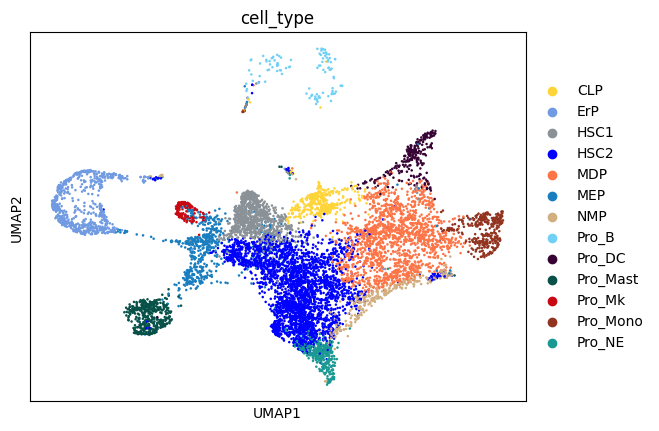

In [7]:
sc.pl.umap(query_adata, color=['cell_type'])

In [8]:
ref_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,
WT_1:ACAGCTCAGTCCTAAGCATCTACG,WT_Veh,364,321,7.800000,19.400000,2399,1031,1,1,MEP,WT_1:ACAGCTCAGTCCTAAGCATCTACG,-2.233542,0.762529,19,274,274.0,1541.098633,0.120449
WT_1:ATCACACGTTGATCCGACATAGGC,WT_Veh,395,323,5.600000,15.200000,2441,982,6,6,HSC2,WT_1:ATCACACGTTGATCCGACATAGGC,0.074522,-5.912224,22,273,273.0,1684.999878,0.008397
WT_1:CTGATCGTTGTGAAGCCTTCACCA,WT_Veh,388,335,4.400000,18.000000,2434,996,6,6,HSC2,WT_1:CTGATCGTTGTGAAGCCTTCACCA,-0.387480,-1.258588,21,279,279.0,1619.170288,0.188643
WT_1:TCGCTGTTTACATCGGTTGTCGGT,WT_Veh,366,307,10.000000,16.800000,2405,1008,6,6,HSC2,WT_1:TCGCTGTTTACATCGGTTGTCGGT,0.510579,-2.121115,12,261,261.0,1631.415649,0.072912
WT_1:ACGTTCAGACCTAAGGAGCAGATG,WT_Veh,382,313,7.768924,16.135458,2409,993,14,14,NMP,WT_1:ACGTTCAGACCTAAGGAGCAGATG,4.386117,-3.009962,10,271,271.0,1640.854126,0.135202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WT_1:ACTAGGAGCGACCATTAACCTTGG,WT_Veh,18329,4860,6.964848,18.005483,3762,2171,4,4,Pro_NE,WT_1:ACTAGGAGCGACCATTAACCTTGG,2.084571,-3.866332,302,8765,8765.0,2426.150146,0.128072
WT_1:GTAGGAGTACGTGATGGCTTAGCT,WT_Veh,18203,4676,6.693621,18.957772,4199,2363,16,16,ErP,WT_1:GTAGGAGTACGTGATGGCTTAGCT,-12.783268,2.399477,294,8395,8395.0,2524.649658,0.270798
WT_1:ACGACTTGGACTATGCTTACGGCT,WT_Veh,18165,4666,7.601893,19.512195,4003,2210,16,16,ErP,WT_1:ACGACTTGGACTATGCTTACGGCT,-10.572094,0.196290,224,9253,9253.0,2278.182617,0.260864


In [9]:
query_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,Tet2mut_DSS,401,338,5.200000,14.600000,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,Tet2mut_DSS,426,367,6.600000,8.200000,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Tet2mut_DSS,378,322,19.361277,4.990020,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.744210,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


In [10]:
#plt.rcParams["font.family"] = "arial"
import matplotlib.colors as colors
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [4,4]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline

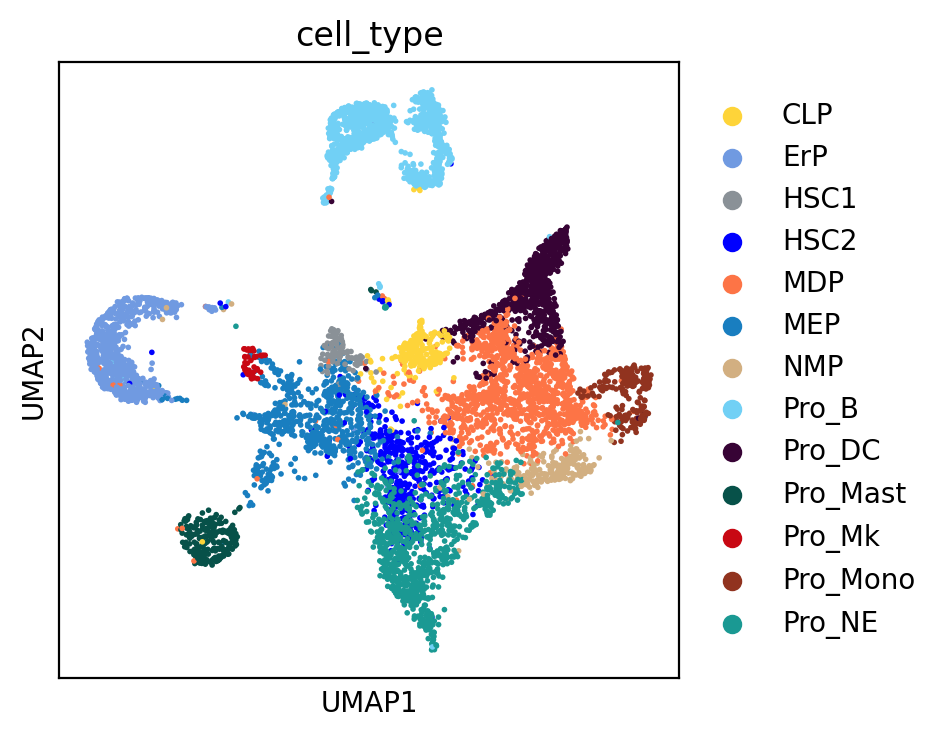

In [11]:
sc.pl.umap(ref_adata, color=['cell_type'])

In [12]:
%%time
# max_g=300,max_gs=300
# mouse_gobp
TOSICA.train(ref_adata, gmt_path='mouse_gobp', label_name='cell_type', epochs=5, 
             max_g=300, max_gs=300,
             project='Hehang_DSS_mouse_gobp_test21')

cuda:0


KeyboardInterrupt: 

In [192]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test21')

cuda:0
0
7266
CPU times: user 27.8 s, sys: 8.49 s, total: 36.3 s
Wall time: 14.9 s


In [12]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, batch_size = 1000, project='Hehang_DSS_mouse_gobp_test21')

cuda:0
cls_token : torch.Size([1, 1, 48])
feature_embed.fe.mask : torch.Size([14400, 30065])
feature_embed.fe.weight : torch.Size([14400, 30065])
feature_embed.fe.bias : torch.Size([14400])
blocks.0.norm1.weight : torch.Size([48])
blocks.0.norm1.bias : torch.Size([48])
blocks.0.attn.qkv.weight : torch.Size([144, 48])
blocks.0.attn.qkv.bias : torch.Size([144])
blocks.0.attn.proj.weight : torch.Size([48, 48])
blocks.0.attn.proj.bias : torch.Size([48])
blocks.0.norm2.weight : torch.Size([48])
blocks.0.norm2.bias : torch.Size([48])
blocks.0.mlp.fc1.weight : torch.Size([192, 48])
blocks.0.mlp.fc1.bias : torch.Size([192])
blocks.0.mlp.fc2.weight : torch.Size([48, 192])
blocks.0.mlp.fc2.bias : torch.Size([48])
blocks.1.norm1.weight : torch.Size([48])
blocks.1.norm1.bias : torch.Size([48])
blocks.1.attn.qkv.weight : torch.Size([144, 48])
blocks.1.attn.qkv.bias : torch.Size([144])
blocks.1.attn.proj.weight : torch.Size([48, 48])
blocks.1.attn.proj.bias : torch.Size([48])
blocks.1.norm2.weight :

In [14]:
#%%time
#model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
#new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, batch_size = 1000, project='Hehang_DSS_mouse_gobp_test21')

In [13]:
pre0 = torch.load("./0Pre_tensor.pt")
pre1 = torch.load("./1Pre_tensor.pt")
pre2 = torch.load("./2Pre_tensor.pt")
pre3 = torch.load("./3Pre_tensor.pt")
pre4 = torch.load("./4Pre_tensor.pt")
pre5 = torch.load("./5Pre_tensor.pt")
pre6 = torch.load("./6Pre_tensor.pt")
pre7 = torch.load("./7Pre_tensor.pt")
pre8 = torch.load("./8Pre_tensor.pt")

In [16]:
import pandas as pd
df0 = pre0.numpy()
df0 = pd.DataFrame(df0)

df1 = pre1.numpy()
df1 = pd.DataFrame(df1)

df2 = pre2.numpy()
df2 = pd.DataFrame(df2)

df3 = pre3.numpy()
df3 = pd.DataFrame(df3)

df4 = pre4.numpy()
df4 = pd.DataFrame(df4)

df5 = pre5.numpy()
df5 = pd.DataFrame(df5)

df6 = pre6.numpy()
df6 = pd.DataFrame(df6)

df7 = pre7.numpy()
df7 = pd.DataFrame(df7)

df8 = pre8.numpy()
df8 = pd.DataFrame(df8)


In [17]:
df_preMatrix = pd.concat([df0,df1,df2,df3,df4,df5,df6,df7,df8])
df_preMatrix.to_csv("TOSICA_PreMatrix_TET2DSS.csv")
df_preMatrix

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,2.710490e-02,0.000603,3.797669e-03,0.132479,4.957199e-04,0.568820,7.265949e-05,1.041623e-06,7.025618e-06,2.654372e-01,1.783671e-06,4.421280e-08,0.001181
1,1.931377e-02,0.001474,8.411326e-03,0.094999,9.335719e-05,0.794320,1.588449e-05,1.294007e-06,2.477254e-06,8.076634e-02,2.444082e-06,2.011769e-08,0.000600
2,2.717156e-01,0.000009,1.210398e-03,0.004733,2.032205e-02,0.026540,1.562268e-04,9.039858e-06,6.347558e-04,6.746015e-01,6.969617e-08,2.282929e-07,0.000069
3,1.533337e-04,0.580436,1.566604e-01,0.004581,1.358044e-08,0.256528,5.200455e-08,4.711602e-05,3.990112e-08,7.132864e-06,1.504967e-03,8.080929e-08,0.000081
4,3.167373e-08,0.001669,7.781451e-07,0.002297,5.602616e-05,0.000012,6.795766e-02,1.263451e-05,1.096193e-05,6.142877e-06,6.244034e-01,9.644217e-02,0.207132
...,...,...,...,...,...,...,...,...,...,...,...,...,...
969,1.944415e-07,0.001062,8.157583e-07,0.187992,4.706071e-05,0.001241,2.925942e-02,2.386353e-08,1.875237e-07,9.440919e-04,6.293157e-03,6.269386e-05,0.773097
970,9.514152e-07,0.910169,6.975090e-03,0.001472,2.853559e-09,0.008590,2.883743e-07,3.658516e-05,1.378887e-08,1.767252e-07,7.230497e-02,3.455527e-06,0.000447
971,9.929382e-08,0.000571,3.355919e-07,0.083398,8.887787e-05,0.000313,7.125259e-02,4.578822e-08,4.850272e-07,5.140546e-04,1.153975e-02,3.311489e-04,0.831991
972,8.344022e-08,0.003636,1.352474e-06,0.135831,1.372595e-05,0.001039,1.735502e-02,5.555710e-08,1.216824e-07,2.143231e-04,2.949412e-02,1.355784e-04,0.812280


In [18]:
df_meta = new_adata.obs
#df = df_meta.join(df_preMatrix)
df_meta.to_csv("TOSICA_PreMeta_TET2DSS.csv")
df_meta

,Prediction,Probability,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,MEP,0.568820,Tet2mut_DSS,401,338,5.2,14.6,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,MEP,0.794320,Tet2mut_DSS,426,367,6.6,8.2,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Pro_Mast,0.674601,Tet2mut_DSS,378,322,19.361277,4.99002,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,ErP,0.580436,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Pro_Mk,0.624403,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.74421,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Pro_NE,0.773097,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,ErP,0.910169,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Pro_NE,0.831991,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


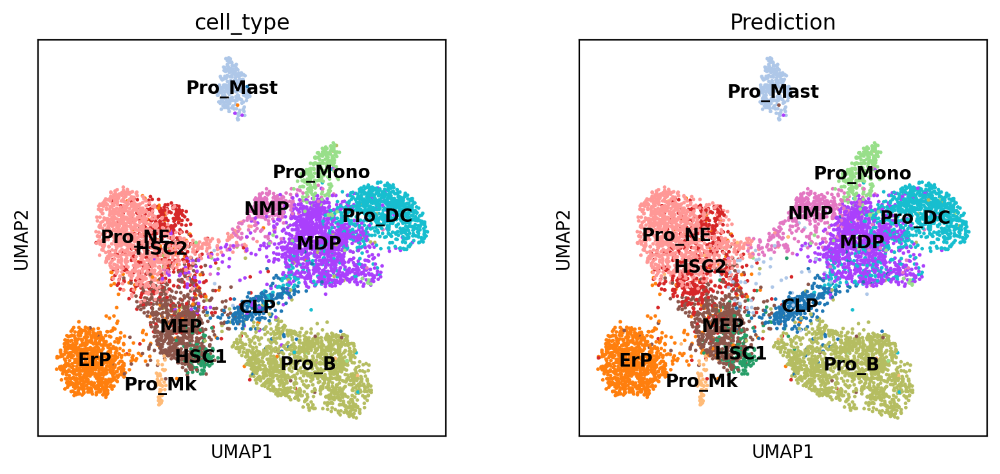

In [193]:
new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

In [194]:
palette = {"CLP":"#FED439FF",
         "ErP":"#709AE1FF",
         "HSC1":"#8A9197FF",
         "HSC2":"blue",
         "MDP":"#FD7446FF",
         "MEP":"#197EC0FF", 
         "NMP":"#D2AF81FF",
         "Pro_B":"#71D0F5FF",
         "Pro_DC":"#370335FF",
         "Pro_Mast":"#075149FF",
         "Pro_Mk":"#C80813FF",
         "Pro_Mono":"#91331FFF",
         "Pro_NE":"#1A9993FF"}

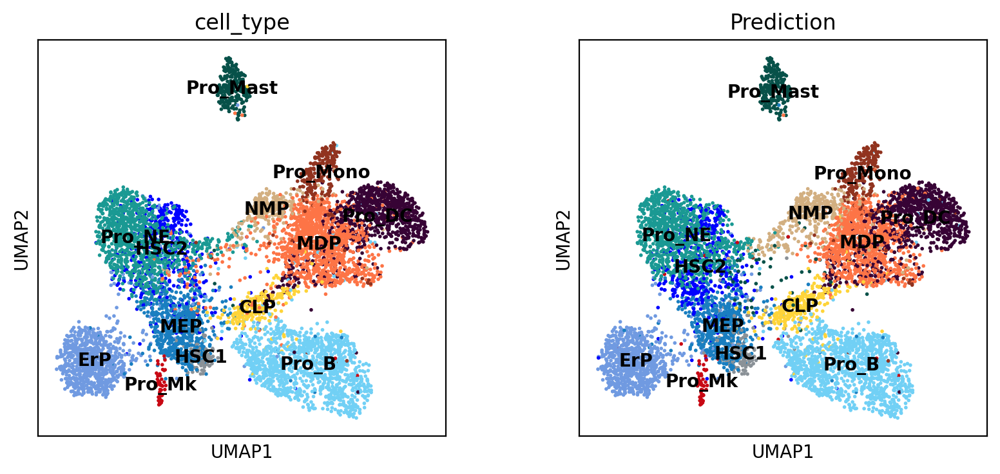

In [195]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [196]:
new_adata.obs['Prediction']

barcode
WT_1:ACAGCTCAGTCCTAAGCATCTACG      HSC1
WT_1:ATCACACGTTGATCCGACATAGGC    Pro_NE
WT_1:CTGATCGTTGTGAAGCCTTCACCA    Pro_DC
WT_1:TCGCTGTTTACATCGGTTGTCGGT      HSC2
WT_1:ACGTTCAGACCTAAGGAGCAGATG       NMP
                                  ...  
WT_1:ACTAGGAGCGACCATTAACCTTGG    Pro_NE
WT_1:GTAGGAGTACGTGATGGCTTAGCT       ErP
WT_1:ACGACTTGGACTATGCTTACGGCT       ErP
WT_1:GCGTCATTTGCCATTCCACTGACA       ErP
WT_1:ACGTTCAGTCGAACCAAACCTTGG       ErP
Name: Prediction, Length: 7266, dtype: category
Categories (13, object): ['CLP', 'ErP', 'HSC1', 'HSC2', ..., 'Pro_Mast', 'Pro_Mk', 'Pro_Mono', 'Pro_NE']

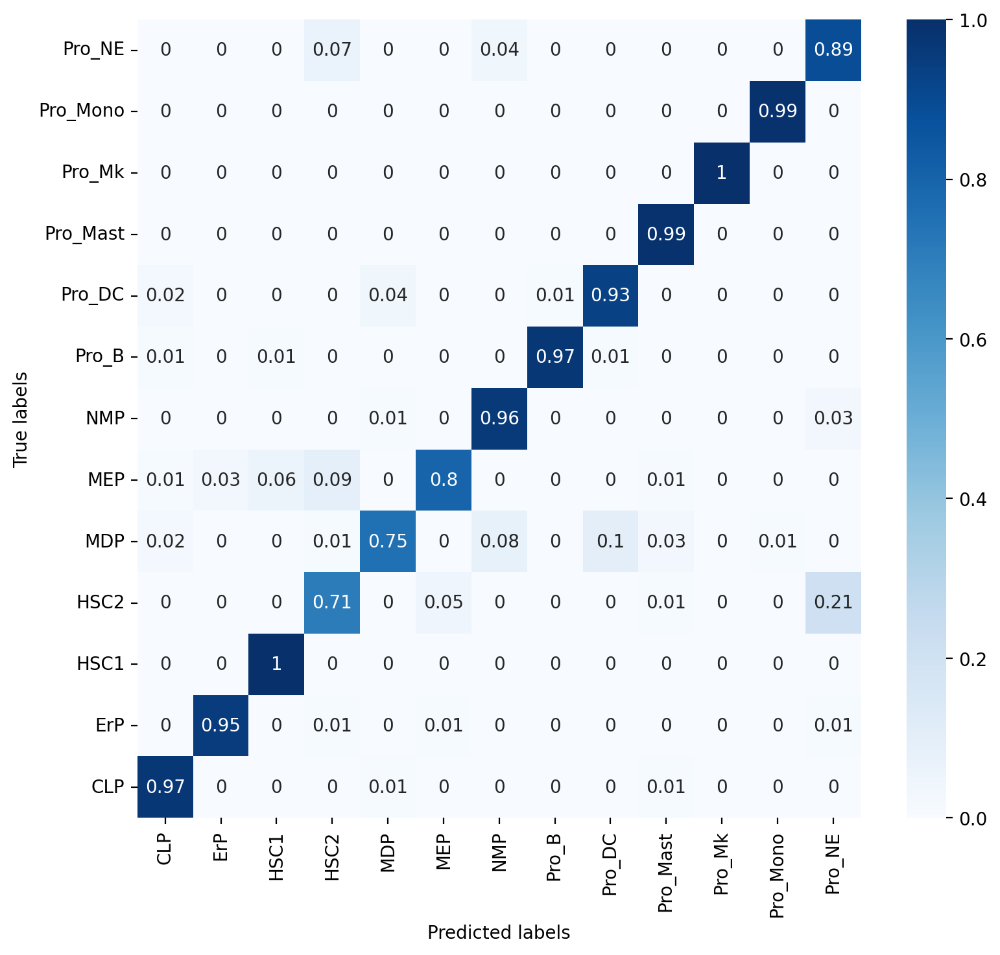

In [197]:
# plotting confusion matrix ### WT
df = new_adata.obs
con_mat = confusion_matrix(df['cell_type'],df['Prediction'])
con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [198]:
## 重新排序
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 
con_mat_norm =con_mat_norm.loc[order,:]
con_mat_norm = con_mat_norm.loc[:,order]
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00
CLP,0.00,0.97,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.00,0.0,0.00,0.00
MEP,0.06,0.01,0.80,0.09,0.00,0.00,0.00,0.00,0.01,0.00,0.0,0.03,0.00
HSC2,0.00,0.00,0.05,0.71,0.00,0.00,0.21,0.00,0.01,0.00,0.0,0.00,0.00
MDP,0.00,0.02,0.00,0.01,0.75,0.08,0.00,0.01,0.03,0.10,0.0,0.00,0.00
NMP,0.00,0.00,0.00,0.00,0.01,0.96,0.03,0.00,0.00,0.00,0.0,0.00,0.00
Pro_NE,0.00,0.00,0.00,0.07,0.00,0.04,0.89,0.00,0.00,0.00,0.0,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99,0.00,0.00,0.0,0.00,0.00
Pro_Mast,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99,0.00,0.0,0.00,0.00
Pro_DC,0.00,0.02,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.93,0.0,0.00,0.01


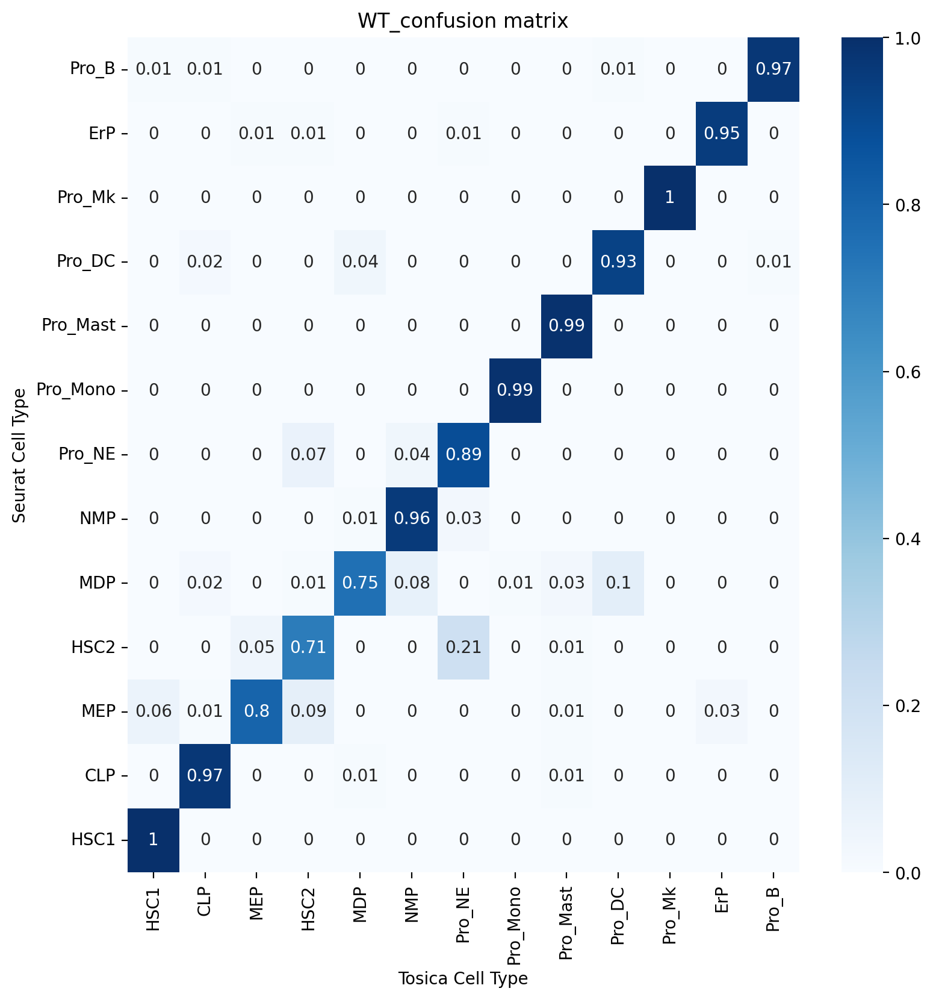

In [199]:
## 重新画图
#right one 2024-01-08 Cai Lab
plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("WT_confusion matrix")
plt.savefig("WT_confusion matrix.pdf")
plt.show()

In [205]:
new_adata

AnnData object with n_obs × n_vars = 7266 × 299
    obs: 'Prediction', 'Probability', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'cell_type_colors', 'Prediction_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [206]:
new_adata.obsp

PairwiseArrays with keys: distances, connectivities

In [207]:
new_adata.obs.columns

Index(['Prediction', 'Probability', 'orig.ident', 'nCount_RNA', 'nFeature_RNA',
       'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT',
       'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1',
       'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced',
       'initial_size', 'n_counts', 'velocity_self_transition'],
      dtype='object')

In [208]:
new_adata.obs

,Prediction,Probability,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,,,
WT_1:ACAGCTCAGTCCTAAGCATCTACG,HSC1,0.612808,WT_Veh,364,321,7.8,19.4,2399,1031,1,1,MEP,WT_1:ACAGCTCAGTCCTAAGCATCTACG,-2.233542,0.762529,19,274,274.0,1541.098633,0.120449
WT_1:ATCACACGTTGATCCGACATAGGC,Pro_NE,0.559284,WT_Veh,395,323,5.6,15.2,2441,982,6,6,HSC2,WT_1:ATCACACGTTGATCCGACATAGGC,0.074522,-5.912224,22,273,273.0,1684.999878,0.008397
WT_1:CTGATCGTTGTGAAGCCTTCACCA,Pro_DC,0.702273,WT_Veh,388,335,4.4,18.0,2434,996,6,6,HSC2,WT_1:CTGATCGTTGTGAAGCCTTCACCA,-0.38748,-1.258588,21,279,279.0,1619.170288,0.188643
WT_1:TCGCTGTTTACATCGGTTGTCGGT,HSC2,0.759588,WT_Veh,366,307,10.0,16.8,2405,1008,6,6,HSC2,WT_1:TCGCTGTTTACATCGGTTGTCGGT,0.510579,-2.121115,12,261,261.0,1631.415649,0.072912
WT_1:ACGTTCAGACCTAAGGAGCAGATG,NMP,0.863324,WT_Veh,382,313,7.768924,16.135458,2409,993,14,14,NMP,WT_1:ACGTTCAGACCTAAGGAGCAGATG,4.386117,-3.009962,10,271,271.0,1640.854126,0.135202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WT_1:ACTAGGAGCGACCATTAACCTTGG,Pro_NE,0.835763,WT_Veh,18329,4860,6.964848,18.005483,3762,2171,4,4,Pro_NE,WT_1:ACTAGGAGCGACCATTAACCTTGG,2.084571,-3.866332,302,8765,8765.0,2426.150146,0.128072
WT_1:GTAGGAGTACGTGATGGCTTAGCT,ErP,0.933935,WT_Veh,18203,4676,6.693621,18.957772,4199,2363,16,16,ErP,WT_1:GTAGGAGTACGTGATGGCTTAGCT,-12.783268,2.399477,294,8395,8395.0,2524.649658,0.270798
WT_1:ACGACTTGGACTATGCTTACGGCT,ErP,0.931362,WT_Veh,18165,4666,7.601893,19.512195,4003,2210,16,16,ErP,WT_1:ACGACTTGGACTATGCTTACGGCT,-10.572094,0.19629,224,9253,9253.0,2278.182617,0.260864


In [209]:
new_adata.obs.to_csv("WT_TOSICA_prediction_meta_table.csv")

In [217]:
%%time
model_weight_path = './.Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test21')

cuda:0


FileNotFoundError: [Errno 2] No such file or directory: './.Hehang_DSS_mouse_gobp_test21/model-4.pth'

In [ ]:
## test2 TF

In [24]:
%%time
# max_g=300,max_gs=300
# mouse_gobp
TOSICA.train(ref_adata, gmt_path='mouse_tf', label_name='cell_type', epochs=5, 
             max_g=300, max_gs=300,
             project='Hehang_DSS_mouse_gobp_test22')

cuda:0
Mask loaded!
Model builded!


[valid epoch 4] loss: 0.358, acc: 0.908: 100%|███████████████████████████████████████████████████████████████████████████████████████| 597/597 [00:09<00:00, 62.99it/s]


Training finished!
CPU times: user 8min 34s, sys: 28.6 s, total: 9min 2s
Wall time: 8min 44s


In [26]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test22/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test22')

cuda:0
0
7266
CPU times: user 28.6 s, sys: 5.36 s, total: 33.9 s
Wall time: 14.5 s


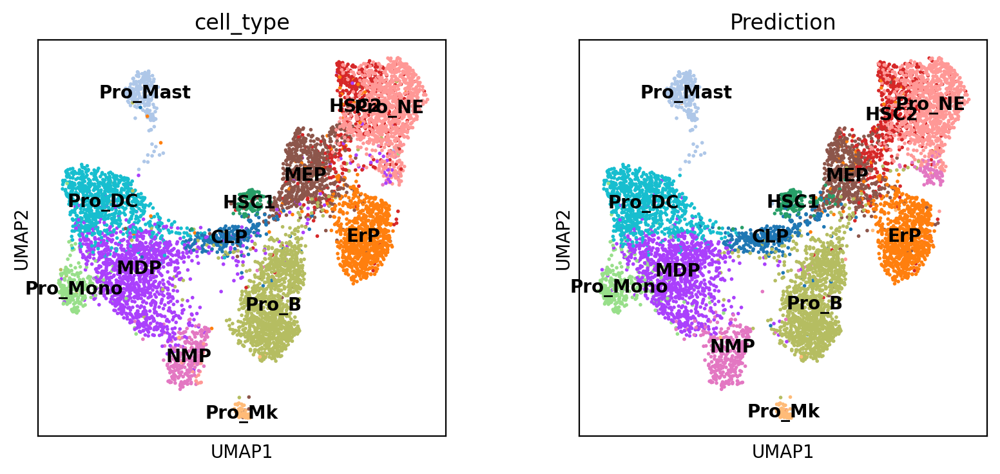

In [27]:
new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

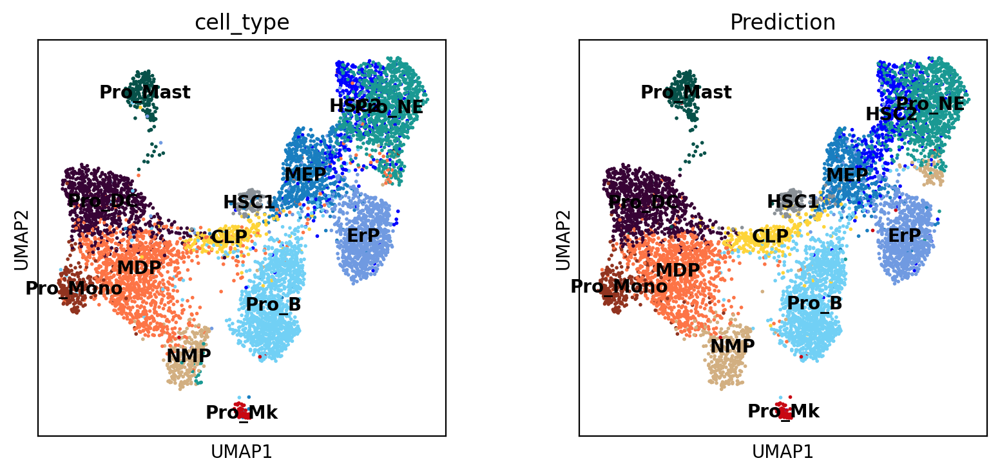

In [28]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [ ]:
## test3 Reactome mouse_reactome

In [29]:
%%time
# max_g=300,max_gs=300
# mouse_gobp
TOSICA.train(ref_adata, gmt_path='mouse_reactome', label_name='cell_type', epochs=5, 
             max_g=300, max_gs=300,
             project='Hehang_DSS_mouse_gobp_test23')

cuda:0
Mask loaded!
Model builded!


[valid epoch 4] loss: 0.443, acc: 0.897: 100%|███████████████████████████████████████████████████████████████████████████████████████| 597/597 [00:09<00:00, 63.11it/s]


Training finished!
CPU times: user 8min 19s, sys: 28.2 s, total: 8min 47s
Wall time: 8min 28s


In [30]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test23/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test23')

cuda:0
0
7266
CPU times: user 28.3 s, sys: 5.77 s, total: 34.1 s
Wall time: 14.6 s


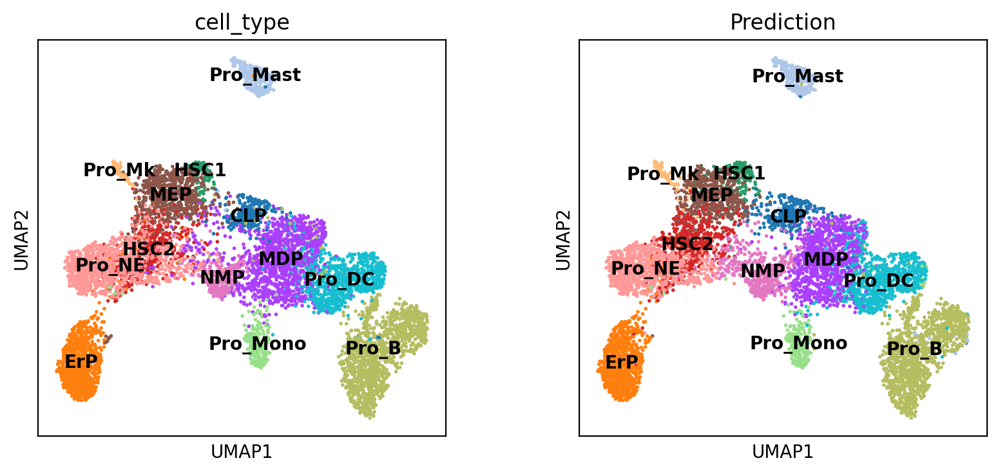

In [31]:
new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

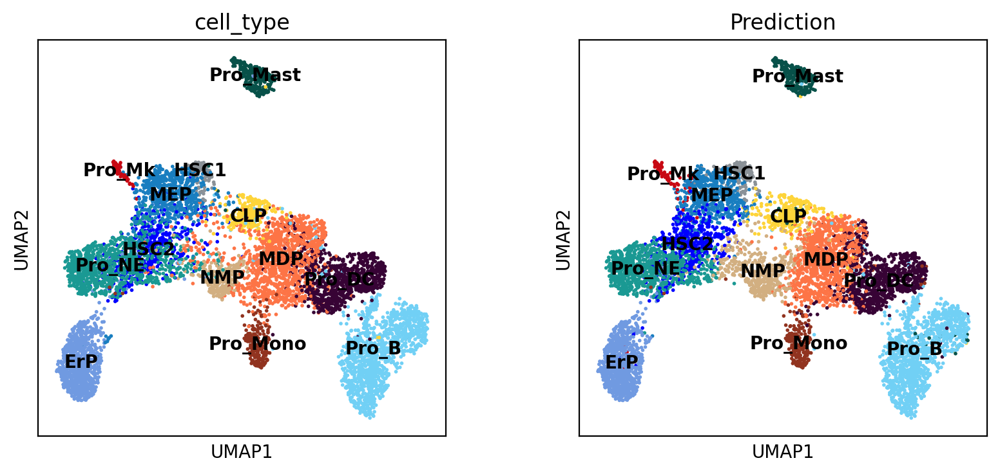

In [32]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [ ]:
### predict other datasets TET2, WTDSS, TET2DSS

In [5]:
%%time
query_adata = sc.read('/disk1/cai015/rename_h5ad/rename_TET2_BM_scVelo.h5ad')
query_adata = query_adata[:,ref_adata.var_names]
print(query_adata)
print(query_adata.obs.cell_type.value_counts())

View of AnnData object with n_obs × n_vars = 4792 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
MDP         910
MEP         907
Pro_NE      748
HSC2        490
Pro_Mast    356
Pro_Mono    296
ErP         271
Pro_DC      256
HSC1        243

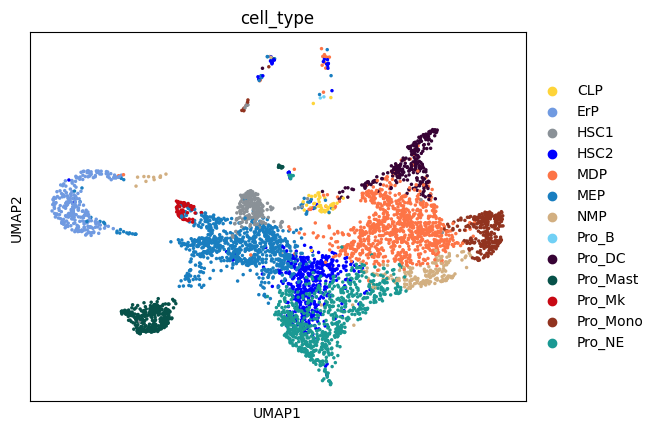

In [6]:
sc.pl.umap(query_adata, color=['cell_type'])

In [7]:
query_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,
Tet_1:ACCACGATGAACGCTTGTTCATGG,Tet2mut_Veh,402,352,5.600000,14.000000,2424,999,6,6,HSC2,Tet_1:ACCACGATGAACGCTTGTTCATGG,-0.124427,-1.558100,10,264,264.0,2579.655273,0.479304
Tet_1:ACTCCATCAGGAGGAAAGGATGGT,Tet2mut_Veh,385,317,6.600000,16.400000,2420,1003,6,6,HSC2,Tet_1:ACTCCATCAGGAGGAAAGGATGGT,0.227179,-4.109934,20,286,286.0,2296.608398,0.108323
Tet_1:AGAACGAGAAGGACACGTCTAGGT,Tet2mut_Veh,405,353,6.200000,12.600000,2418,1005,1,1,MEP,Tet_1:AGAACGAGAAGGACACGTCTAGGT,-1.518546,-1.703528,9,308,308.0,2227.969238,0.303450
Tet_1:CCGTAAGAAGTCTGTGAGGCATAG,Tet2mut_Veh,386,337,7.600000,15.200000,2410,1006,1,1,MEP,Tet_1:CCGTAAGAAGTCTGTGAGGCATAG,-0.871045,-1.166330,16,279,279.0,2354.229248,0.555574
Tet_1:GATTACCGCTCATTGCTGCGTAGA,Tet2mut_Veh,380,321,5.200000,18.800000,2393,992,6,6,HSC2,Tet_1:GATTACCGCTCATTGCTGCGTAGA,0.215499,-1.525710,29,260,260.0,2493.028564,0.547854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_1:ATATGCGCAATGGACGTGTCCAGA,Tet2mut_Veh,17237,4633,6.590069,17.511886,3771,2071,4,4,Pro_NE,Tet_1:ATATGCGCAATGGACGTGTCCAGA,1.697090,-6.316693,379,8698,8698.0,3367.375488,0.162263
Tet_1:GAGACGATGAAGAGGTTTCAGCCT,Tet2mut_Veh,16839,4634,7.121973,19.389046,4079,2265,16,16,ErP,Tet_1:GAGACGATGAAGAGGTTTCAGCCT,-12.513557,1.276490,330,8728,8728.0,3287.081543,0.768482
Tet_1:GCTATCCTTCCGTATGTGGTCCTT,Tet2mut_Veh,17267,4857,7.699137,19.288009,3806,2236,4,4,Pro_NE,Tet_1:GCTATCCTTCCGTATGTGGTCCTT,0.662285,-7.073691,314,8609,8609.0,3406.002686,0.273567


cuda:0
0
4792


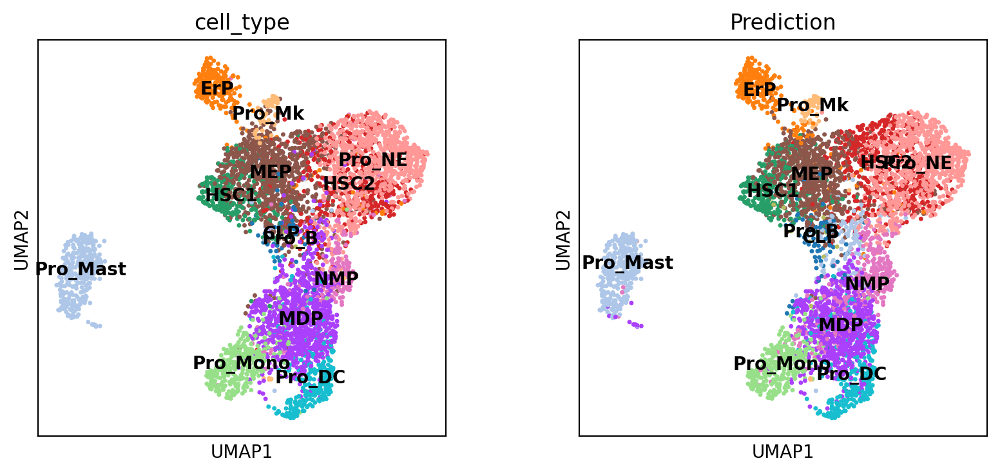

CPU times: user 27.5 s, sys: 7.4 s, total: 34.9 s
Wall time: 15.4 s


In [162]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test21')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')



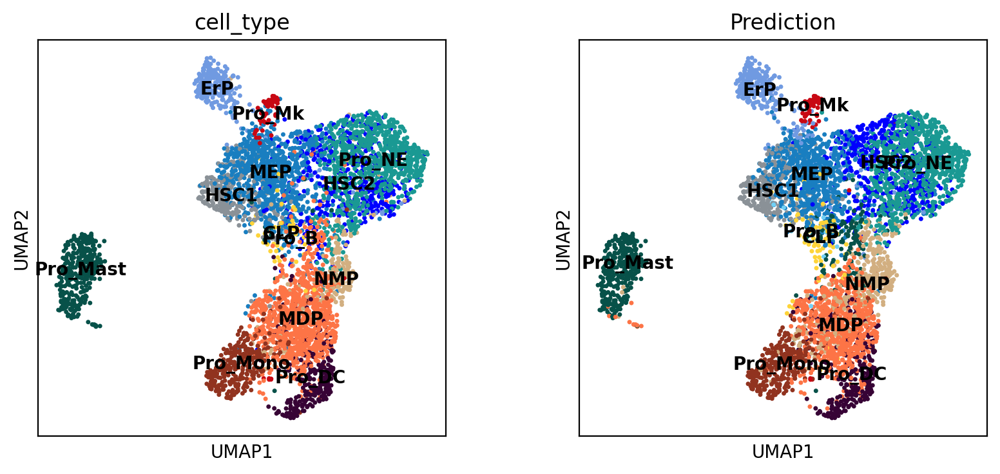

In [163]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

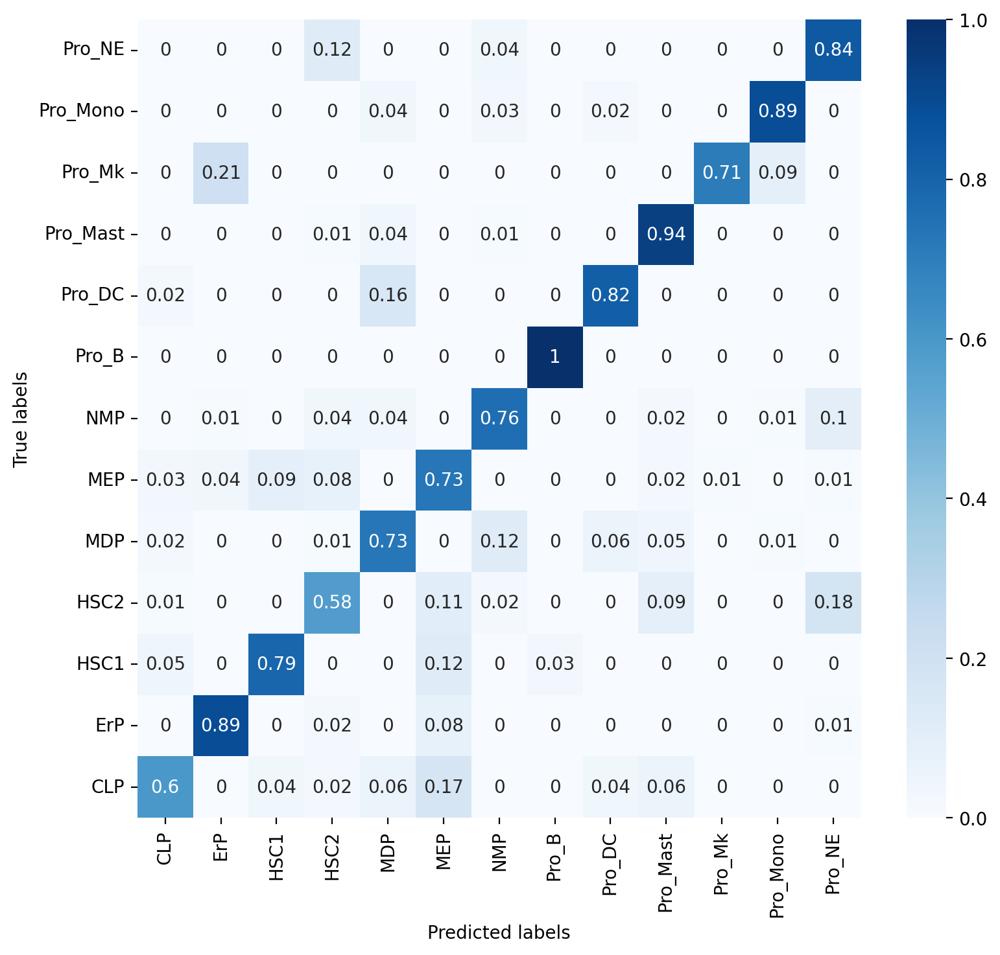

In [164]:
# plotting confusion matrix ### TET2 model_1: GOBP
df = new_adata.obs
con_mat = confusion_matrix(df['cell_type'],df['Prediction'])
con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [165]:
## 重新排序
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 
con_mat_norm =con_mat_norm.loc[order,:]
con_mat_norm = con_mat_norm.loc[:,order]
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,0.79,0.05,0.12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03
CLP,0.04,0.60,0.17,0.02,0.06,0.00,0.00,0.00,0.06,0.04,0.00,0.00,0.00
MEP,0.09,0.03,0.73,0.08,0.00,0.00,0.01,0.00,0.02,0.00,0.01,0.04,0.00
HSC2,0.00,0.01,0.11,0.58,0.00,0.02,0.18,0.00,0.09,0.00,0.00,0.00,0.00
MDP,0.00,0.02,0.00,0.01,0.73,0.12,0.00,0.01,0.05,0.06,0.00,0.00,0.00
NMP,0.00,0.00,0.00,0.04,0.04,0.76,0.10,0.01,0.02,0.00,0.00,0.01,0.00
Pro_NE,0.00,0.00,0.00,0.12,0.00,0.04,0.84,0.00,0.00,0.00,0.00,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.04,0.03,0.00,0.89,0.00,0.02,0.00,0.00,0.00
Pro_Mast,0.00,0.00,0.00,0.01,0.04,0.01,0.00,0.00,0.94,0.00,0.00,0.00,0.00
Pro_DC,0.00,0.02,0.00,0.00,0.16,0.00,0.00,0.00,0.00,0.82,0.00,0.00,0.00


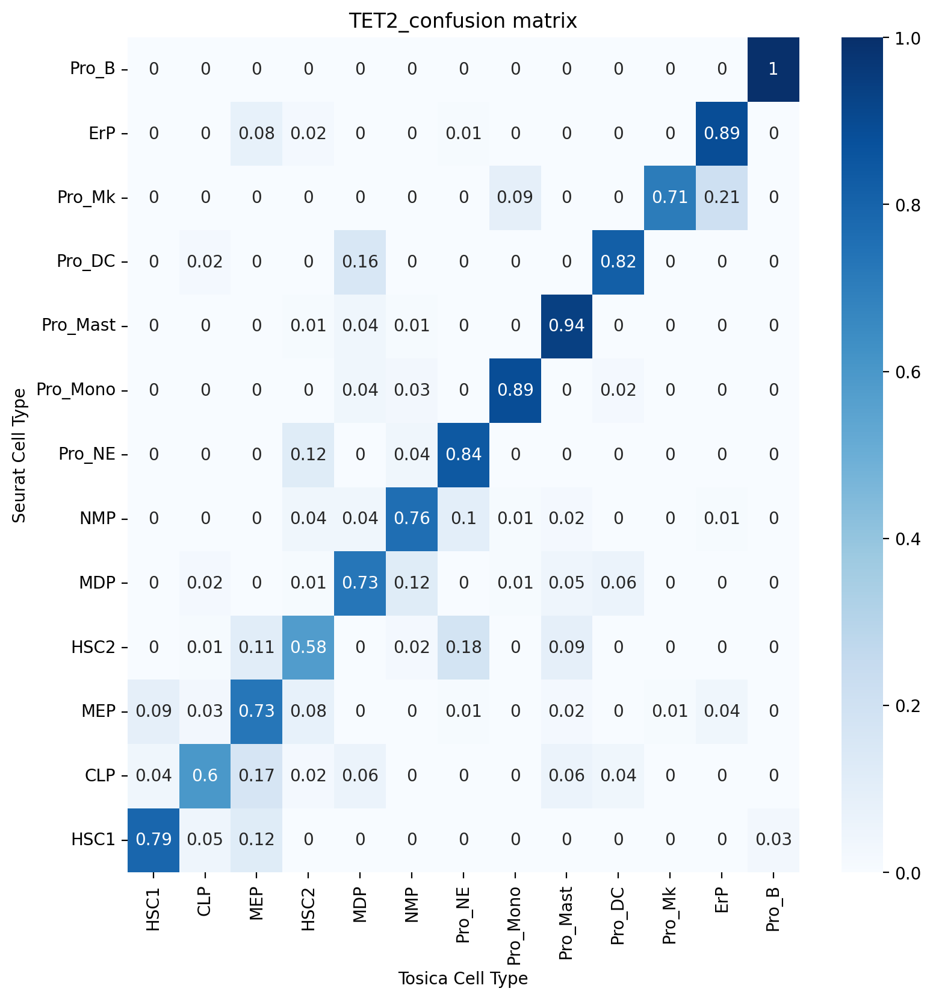

In [166]:
## 重新画图
#right one 2024-02-08 Cai Lab
plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("TET2_confusion matrix")
plt.savefig("TET2_confusion matrix.pdf")
plt.show()

cuda:0
0
4792


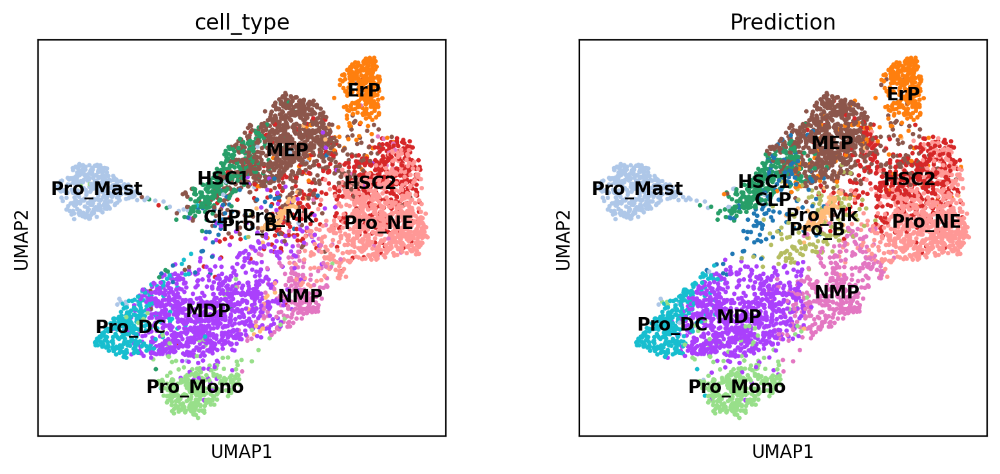

CPU times: user 29.2 s, sys: 5.57 s, total: 34.8 s
Wall time: 15.4 s


In [39]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test22/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test22')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')


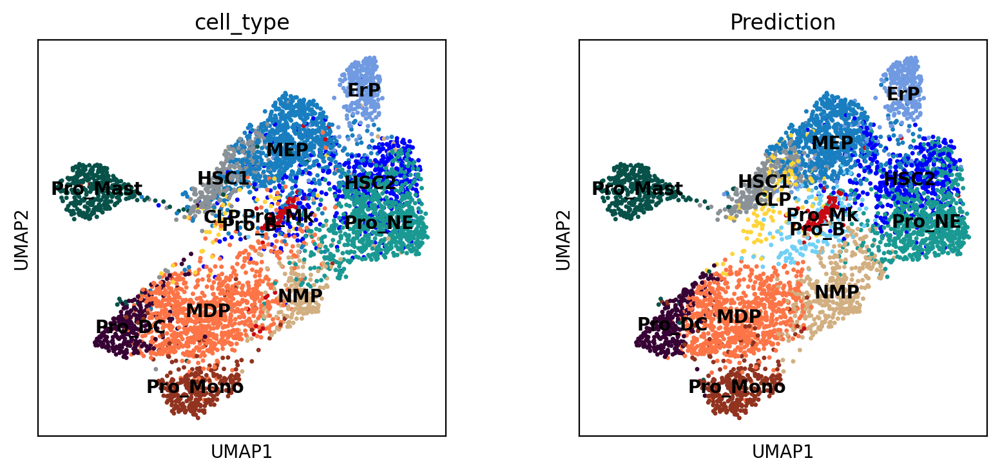

In [40]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

cuda:0
0
4792


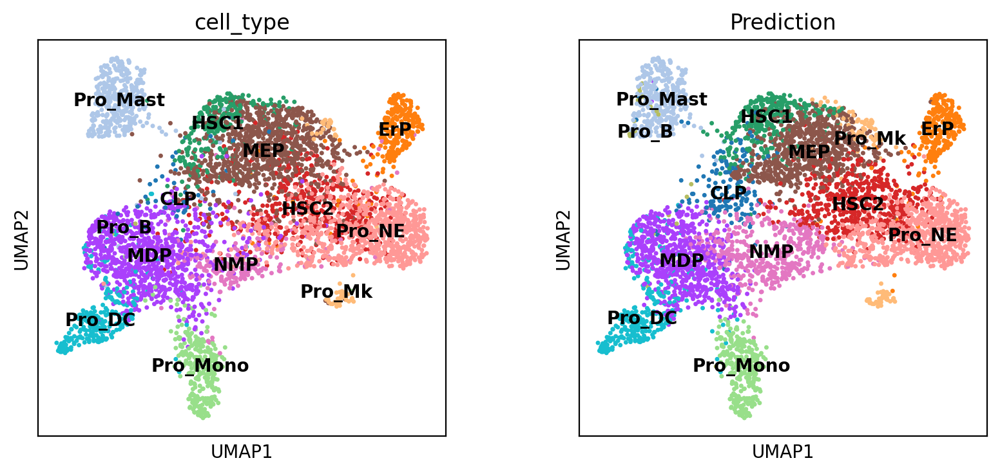

CPU times: user 29.9 s, sys: 5.11 s, total: 35 s
Wall time: 15.4 s


In [41]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test23/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test23')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')


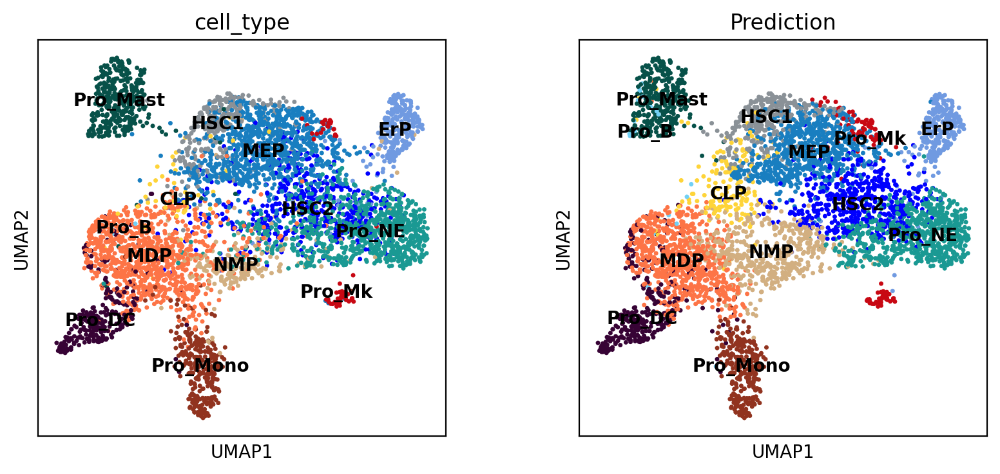

In [42]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [ ]:
## WTDSS

In [167]:
%%time
query_adata = sc.read('/disk1/cai015/rename_h5ad/rename_WTDSS_BM_scVelo.h5ad')
query_adata = query_adata[:,ref_adata.var_names]
print(query_adata)
print(query_adata.obs.cell_type.value_counts())


View of AnnData object with n_obs × n_vars = 5244 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
NMP         1410
Pro_B        893
MDP          643
HSC2         602
Pro_NE       508
Pro_DC       301
Pro_Mono     237
MEP          168
ErP    

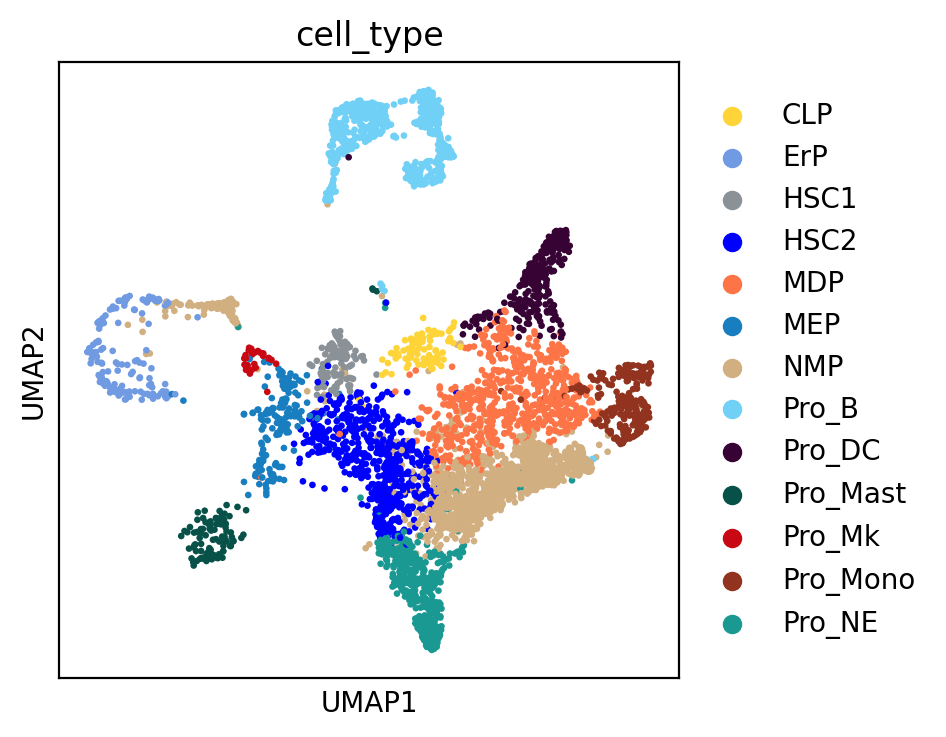

In [168]:
sc.pl.umap(query_adata, color=['cell_type'])

In [169]:
query_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,
WT_DSS:GATAGGCTAAGGACACCGTAGGTT,WT_DSS,374,302,18.400000,6.600000,2370,1014,11,11,Pro_Mast,WT_DSS:GATAGGCTAAGGACACCGTAGGTT,-8.652409,-6.292952,36,205,205.0,5306.744141,0.310009
WT_DSS:ACGGAACACAACCTAGTGCGTAGA,WT_DSS,434,351,5.988024,7.385230,2442,973,14,14,NMP,WT_DSS:ACGGAACACAACCTAGTGCGTAGA,6.938650,-2.097888,14,307,307.0,4155.224121,0.480986
WT_DSS:CACTAGCTCGTCAATGACAGCAAC,WT_DSS,424,364,7.171315,8.366534,2432,988,14,14,NMP,WT_DSS:CACTAGCTCGTCAATGACAGCAAC,-0.403301,-2.947020,44,271,271.0,4564.234375,0.099263
WT_DSS:GTTACGCAGATGCACTTCTCCGAT,WT_DSS,435,369,6.175299,7.171315,2432,981,14,14,NMP,WT_DSS:GTTACGCAGATGCACTTCTCCGAT,-7.073118,3.693542,13,247,247.0,5164.591309,0.277965
WT_DSS:ATCGATCGTGTGAAGCCAGGTATC,WT_DSS,392,326,12.326044,9.741551,2363,1031,10,10,Pro_B,WT_DSS:ATCGATCGTGTGAAGCCAGGTATC,-2.727995,10.256562,22,193,193.0,5991.886230,0.510830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WT_DSS:CTGTTGACCAGTTCTGGCTTAGCT,WT_DSS,19003,4877,8.467921,14.592188,3806,2121,15,15,Pro_NE,WT_DSS:CTGTTGACCAGTTCTGGCTTAGCT,1.244179,-7.219161,382,8524,8524.0,6539.686523,0.117318
WT_DSS:ACAGCTCACATTCGGTACCTTCTC,WT_DSS,19096,4888,7.265372,15.477346,3820,2223,8,8,NMP,WT_DSS:ACAGCTCACATTCGGTACCTTCTC,0.821045,-2.798793,358,8765,8765.0,6378.235840,0.218758
WT_DSS:CATACCACGCCATAACACGGTCTT,WT_DSS,19047,4860,7.721529,16.094850,3831,2166,15,15,Pro_NE,WT_DSS:CATACCACGCCATAACACGGTCTT,0.697544,-5.363999,374,8763,8763.0,6353.502441,0.042372


cuda:0
0
5244


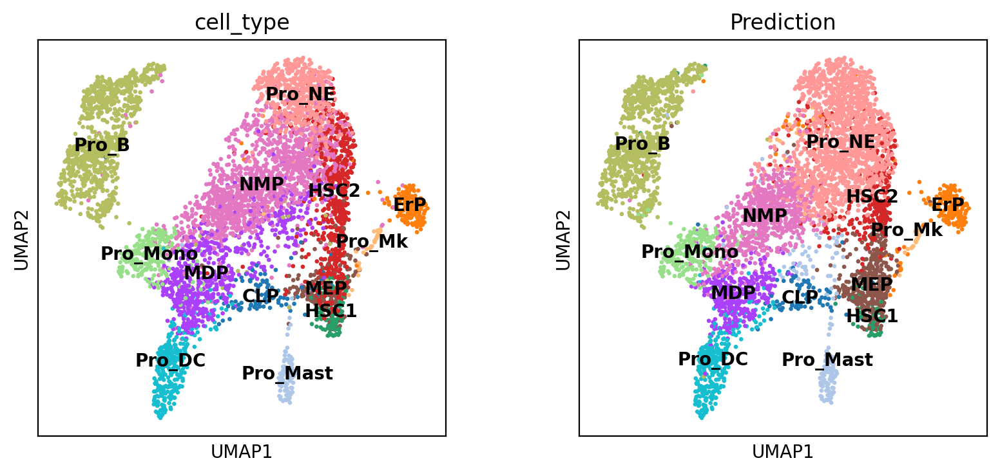

CPU times: user 29.7 s, sys: 7.13 s, total: 36.8 s
Wall time: 16.5 s


In [170]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test21')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

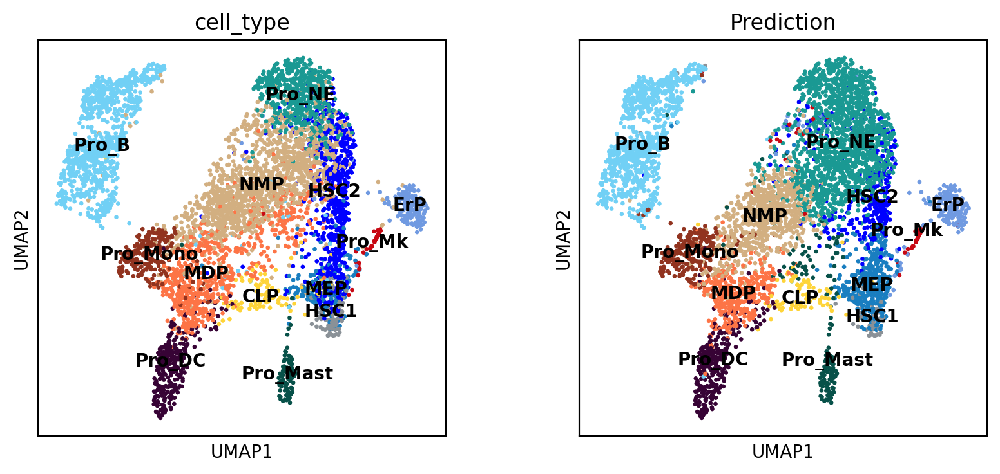

In [171]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

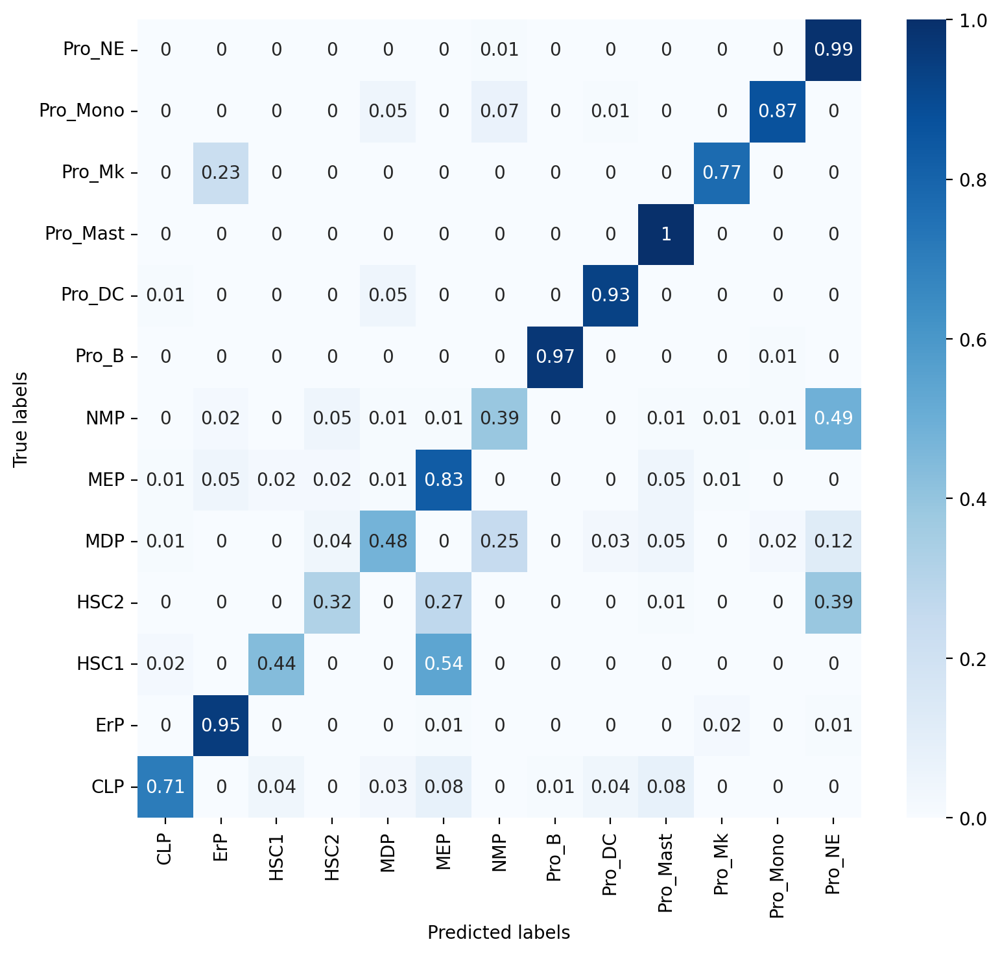

In [174]:
# plotting confusion matrix ### WTDSS model_1: GOBP
df = new_adata.obs
con_mat = confusion_matrix(df['cell_type'],df['Prediction'])
con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [175]:
## 重新排序
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 
con_mat_norm =con_mat_norm.loc[order,:]
con_mat_norm = con_mat_norm.loc[:,order]
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,0.44,0.02,0.54,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
CLP,0.04,0.71,0.08,0.00,0.03,0.00,0.00,0.00,0.08,0.04,0.00,0.00,0.01
MEP,0.02,0.01,0.83,0.02,0.01,0.00,0.00,0.00,0.05,0.00,0.01,0.05,0.00
HSC2,0.00,0.00,0.27,0.32,0.00,0.00,0.39,0.00,0.01,0.00,0.00,0.00,0.00
MDP,0.00,0.01,0.00,0.04,0.48,0.25,0.12,0.02,0.05,0.03,0.00,0.00,0.00
NMP,0.00,0.00,0.01,0.05,0.01,0.39,0.49,0.01,0.01,0.00,0.01,0.02,0.00
Pro_NE,0.00,0.00,0.00,0.00,0.00,0.01,0.99,0.00,0.00,0.00,0.00,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.05,0.07,0.00,0.87,0.00,0.01,0.00,0.00,0.00
Pro_Mast,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
Pro_DC,0.00,0.01,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.93,0.00,0.00,0.00


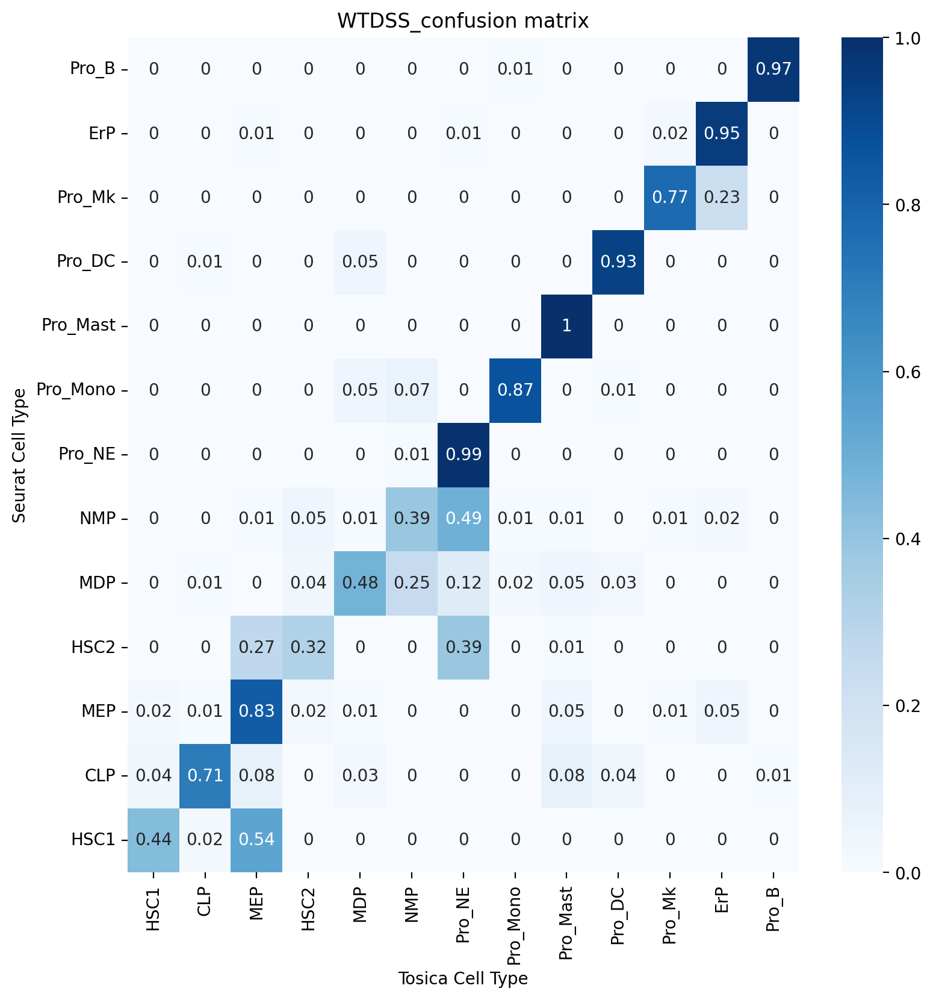

In [177]:
## 重新画图
#right one 2024-02-08 Cai Lab
plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("WTDSS_confusion matrix")
plt.savefig("WTDSS_confusion matrix.pdf")
plt.show()

cuda:0
0
5244


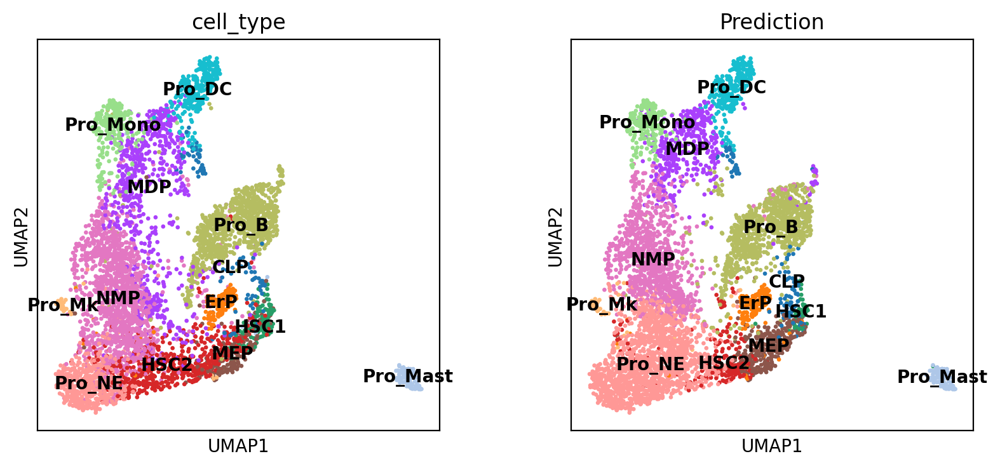

CPU times: user 29.2 s, sys: 7.55 s, total: 36.7 s
Wall time: 16.1 s


In [49]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test22/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test22')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

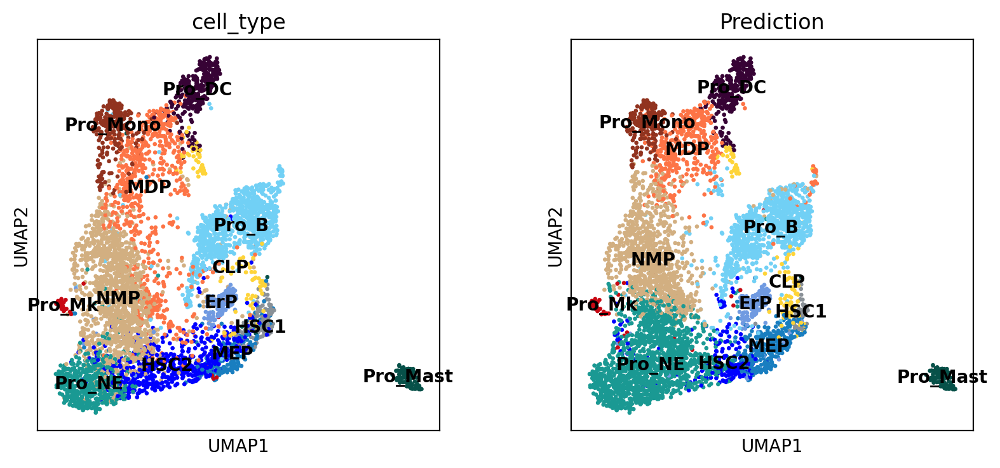

In [50]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

cuda:0
0
5244


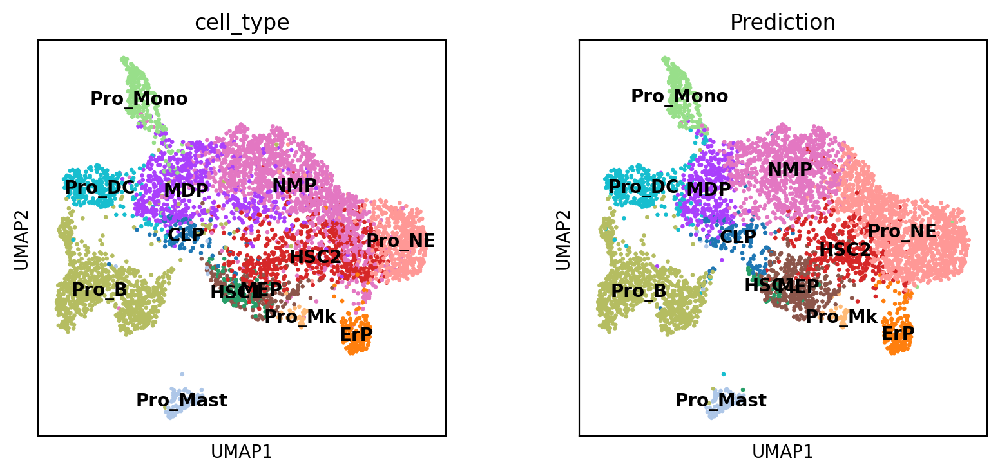

CPU times: user 29.1 s, sys: 7.67 s, total: 36.8 s
Wall time: 16.1 s


In [51]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test23/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test23')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

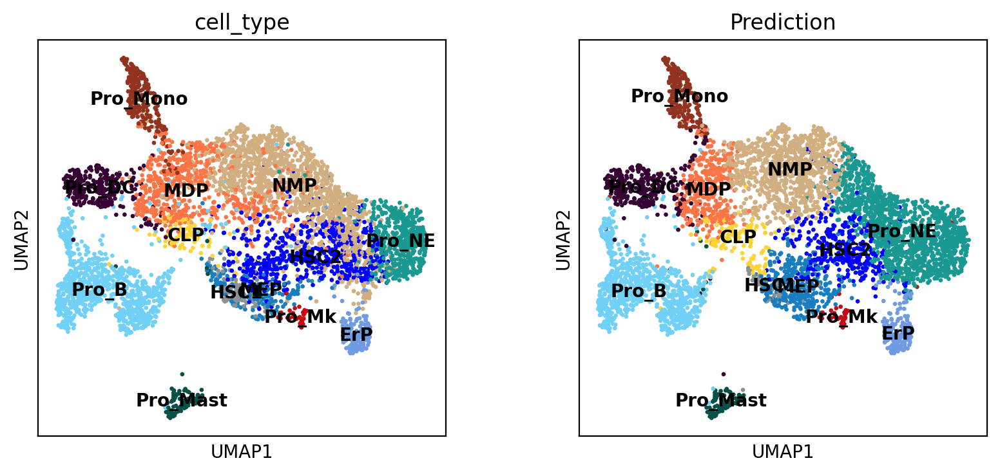

In [52]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [ ]:
## TET2DSS

In [178]:
%%time
query_adata = sc.read('/disk1/cai015/rename_h5ad/rename_TET2DSS_BM_scVelo.h5ad')
query_adata = query_adata[:,ref_adata.var_names]
print(query_adata)
print(query_adata.obs.cell_type.value_counts())


View of AnnData object with n_obs × n_vars = 8974 × 30065
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'barcode', 'UMAP_1', 'UMAP_2', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'cell_type_colors', 'neighbors', 'orig.ident_colors', 'seurat_clusters_colors', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'
cell_type
HSC2        2879
MDP         1553
HSC1         909
MEP          683
ErP          668
Pro_Mast     447
CLP          376
Pro_NE       346
Pro_Mon

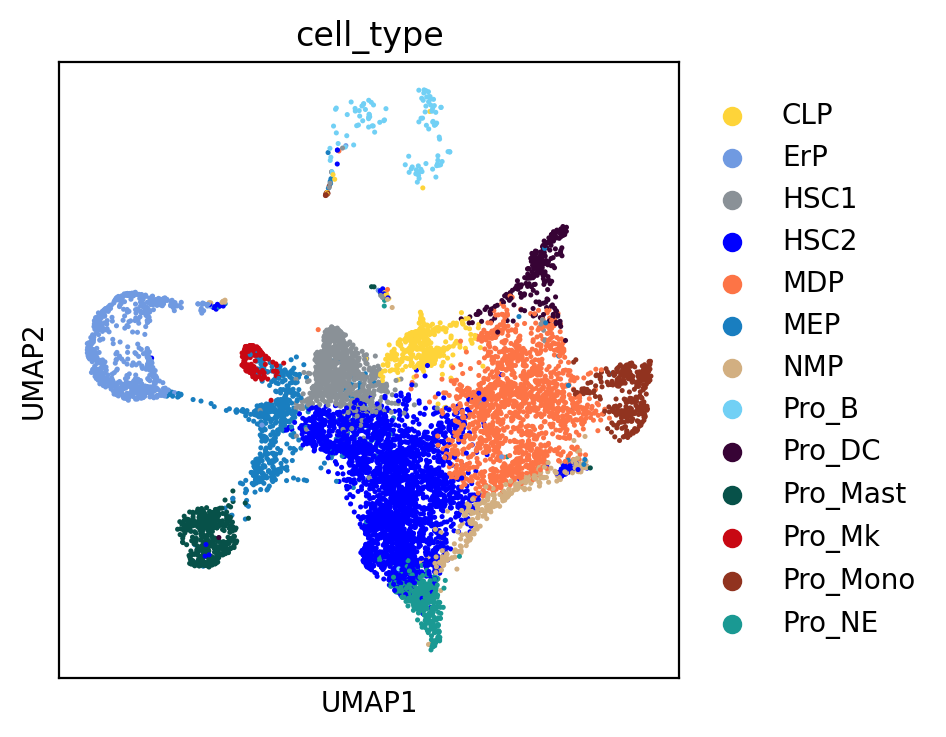

In [179]:
sc.pl.umap(query_adata, color=['cell_type'])

In [180]:
query_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,Tet2mut_DSS,401,338,5.200000,14.600000,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,Tet2mut_DSS,426,367,6.600000,8.200000,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Tet2mut_DSS,378,322,19.361277,4.990020,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.744210,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


cuda:0
0
8974


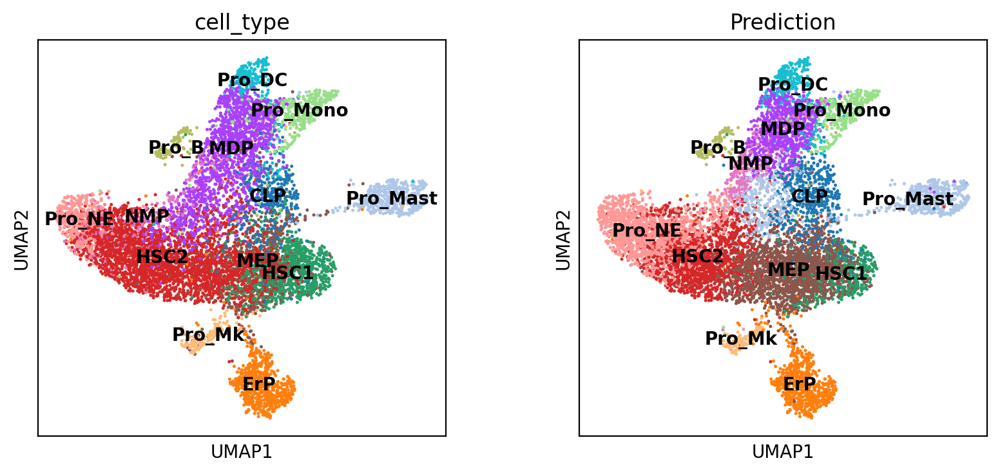

CPU times: user 34.9 s, sys: 10.9 s, total: 45.8 s
Wall time: 21.3 s


In [181]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test21/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test21')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

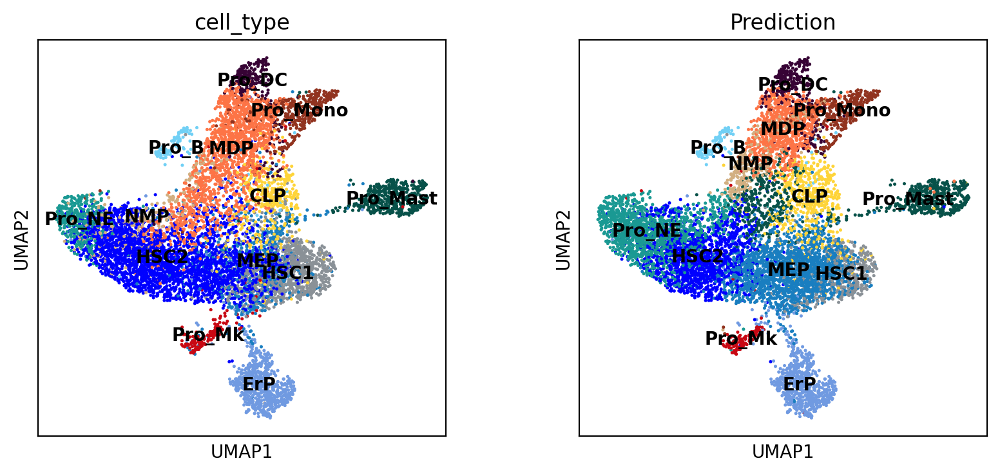

In [182]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

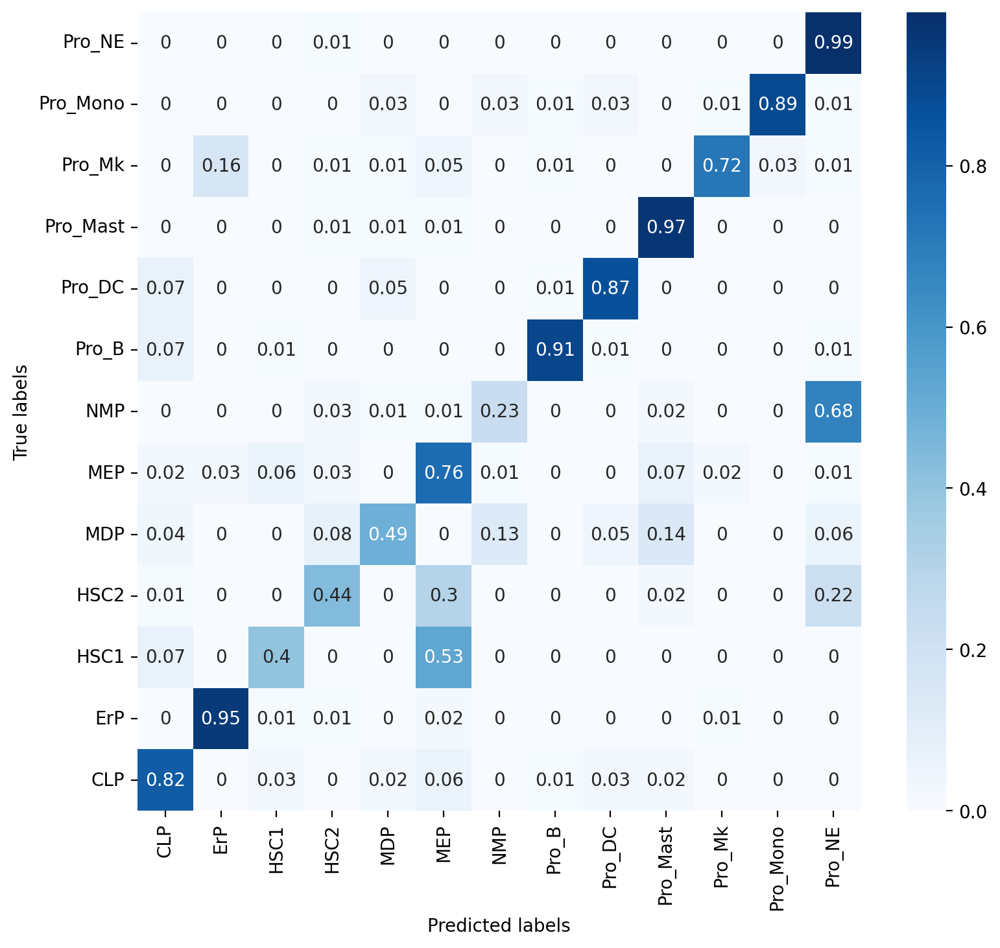

In [183]:
# plotting confusion matrix ### WTDSS model_1: GOBP
df = new_adata.obs
con_mat = confusion_matrix(df['cell_type'],df['Prediction'])
con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [184]:
## 重新排序
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 
con_mat_norm =con_mat_norm.loc[order,:]
con_mat_norm = con_mat_norm.loc[:,order]
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,0.40,0.07,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
CLP,0.03,0.82,0.06,0.00,0.02,0.00,0.00,0.00,0.02,0.03,0.00,0.00,0.01
MEP,0.06,0.02,0.76,0.03,0.00,0.01,0.01,0.00,0.07,0.00,0.02,0.03,0.00
HSC2,0.00,0.01,0.30,0.44,0.00,0.00,0.22,0.00,0.02,0.00,0.00,0.00,0.00
MDP,0.00,0.04,0.00,0.08,0.49,0.13,0.06,0.00,0.14,0.05,0.00,0.00,0.00
NMP,0.00,0.00,0.01,0.03,0.01,0.23,0.68,0.00,0.02,0.00,0.00,0.00,0.00
Pro_NE,0.00,0.00,0.00,0.01,0.00,0.00,0.99,0.00,0.00,0.00,0.00,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.03,0.03,0.01,0.89,0.00,0.03,0.01,0.00,0.01
Pro_Mast,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.97,0.00,0.00,0.00,0.00
Pro_DC,0.00,0.07,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.87,0.00,0.00,0.01


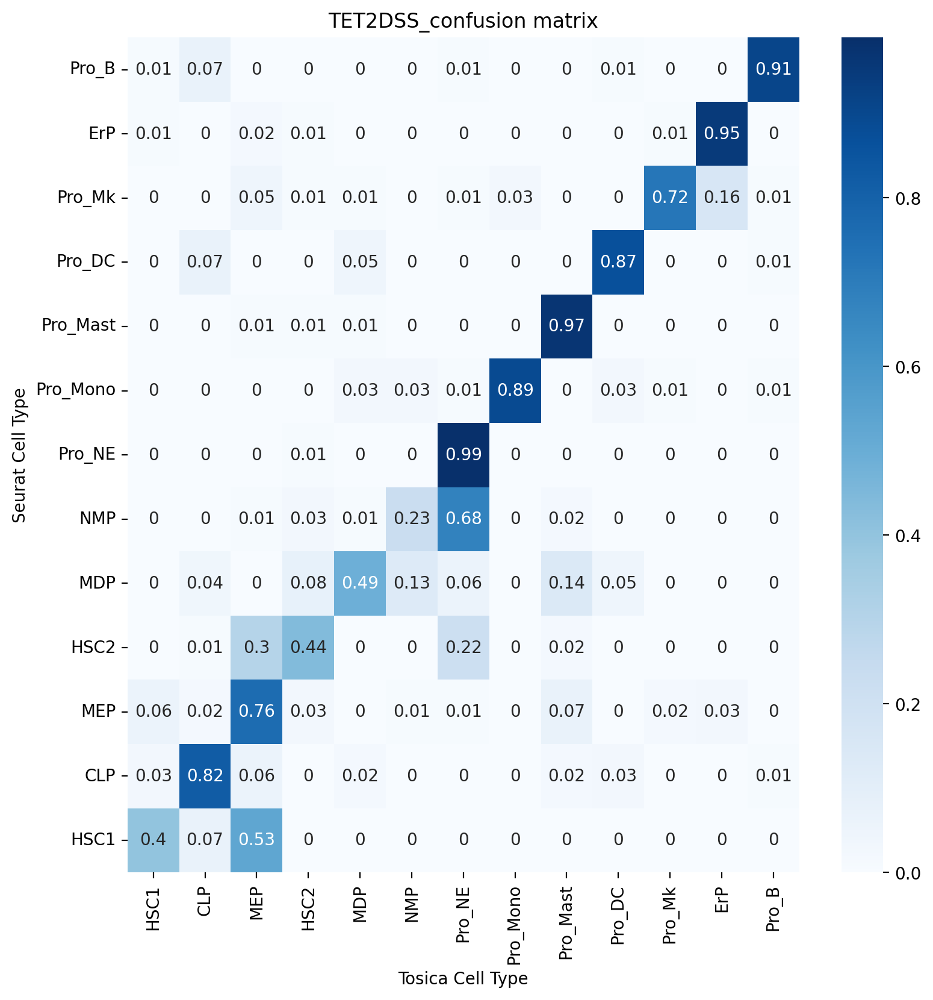

In [185]:
## 重新画图
#right one 2024-02-08 Cai Lab
plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("TET2DSS_confusion matrix")
plt.savefig("TET2DSS_confusion matrix.pdf")
plt.show()

In [ ]:
### STOP here other models are also easy to run and to generate confusion matrix. those will be in supplemental data

cuda:0
0
8974


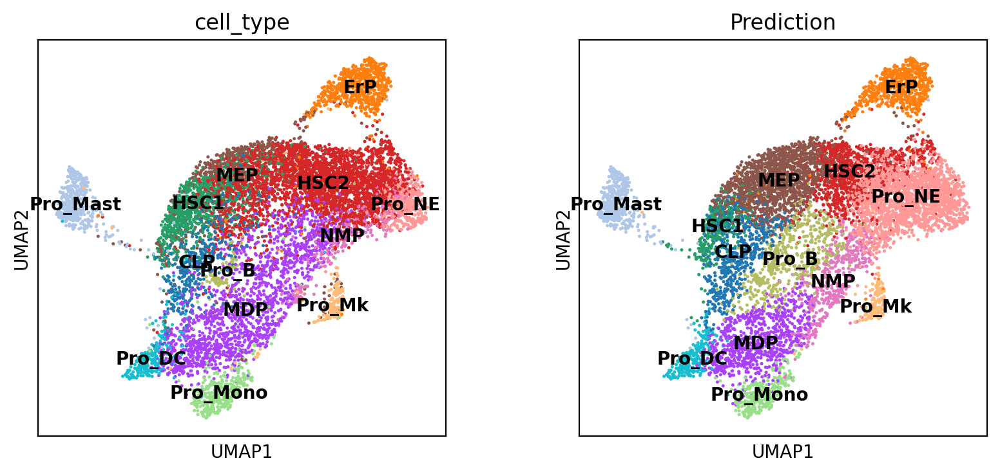

CPU times: user 34.9 s, sys: 10.7 s, total: 45.7 s
Wall time: 21.2 s


In [58]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test22/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test22')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

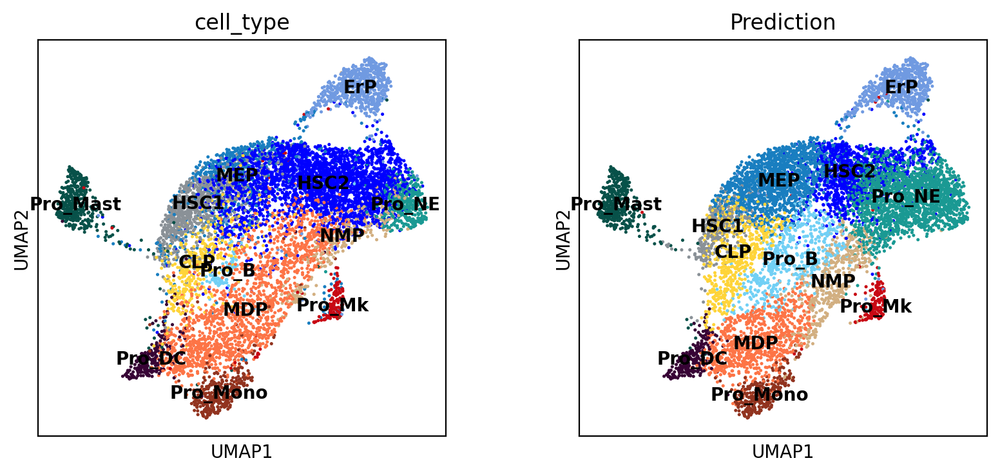

In [59]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

cuda:0
0
8974


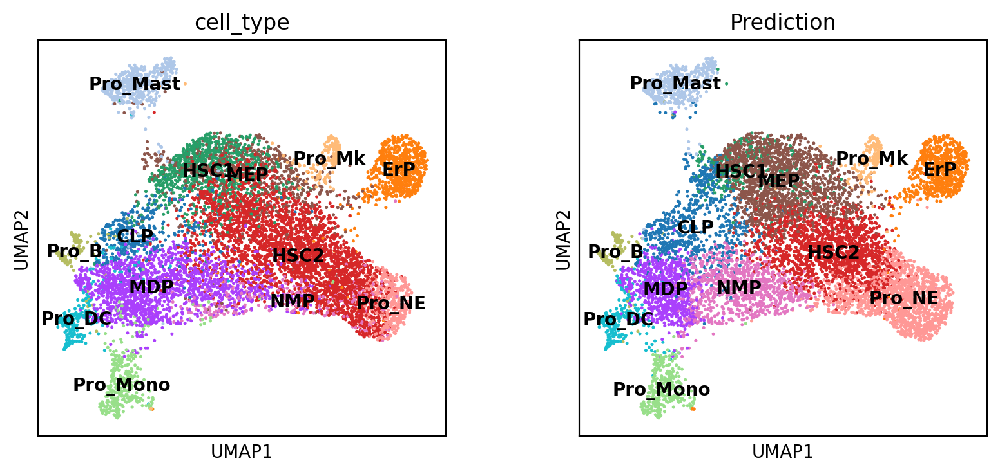

CPU times: user 34.1 s, sys: 11.1 s, total: 45.2 s
Wall time: 21.2 s


In [60]:
%%time
model_weight_path = './Hehang_DSS_mouse_gobp_test23/model-4.pth'
new_adata = TOSICA.pre(query_adata, model_weight_path = model_weight_path, project='Hehang_DSS_mouse_gobp_test23')

new_adata.raw = new_adata
sc.pp.normalize_total(new_adata, target_sum=1e4)
sc.pp.log1p(new_adata)
sc.pp.scale(new_adata, max_value=10)
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pp.neighbors(new_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(new_adata)
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data')

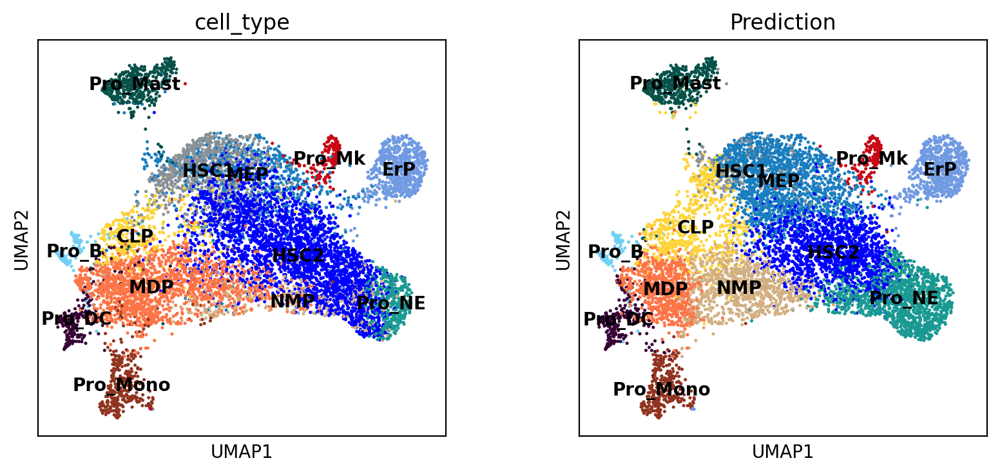

In [61]:
sc.pl.umap(new_adata, color=['cell_type', 'Prediction'],legend_loc='on data', palette=palette)

In [62]:
new_adata.obs

,Prediction,Probability,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,HSC2,0.444510,Tet2mut_DSS,401,338,5.2,14.6,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,HSC2,0.611548,Tet2mut_DSS,426,367,6.6,8.2,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Pro_Mast,0.846228,Tet2mut_DSS,378,322,19.361277,4.99002,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,ErP,0.831381,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Pro_Mk,0.463021,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.74421,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Pro_NE,0.609602,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,ErP,0.939027,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Pro_NE,0.766602,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


In [67]:
df = new_adata.obs
df

,Prediction,Probability,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,HSC2,0.444510,Tet2mut_DSS,401,338,5.2,14.6,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,HSC2,0.611548,Tet2mut_DSS,426,367,6.6,8.2,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Pro_Mast,0.846228,Tet2mut_DSS,378,322,19.361277,4.99002,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,ErP,0.831381,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Pro_Mk,0.463021,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.74421,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Pro_NE,0.609602,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,ErP,0.939027,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Pro_NE,0.766602,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


In [ ]:
#C=confusion_matrix(y_true, y_pred, labels=["ant", "bird", "cat"])
#df=pd.DataFrame(C,index=["ant", "bird", "cat"],columns=["ant", "bird", "cat"])
#sns.heatmap(df,annot=True)

In [68]:
from sklearn.metrics import confusion_matrix
# Assuming that the predicted class labels are in the 'predicted' column and the true class labels are in the 'true' column
# Load the DataFrame
#df = new_adata.obs
# Create the confusion matrix
cm = confusion_matrix(df['Prediction'], df['cell_type'])
# Print the confusion matrix
print(cm)

[[ 310    0  162   62   81   60    1    5    6   16    0    0    0]
 [   0  631    0    6    0   12    2    0    0    0    1    2    1]
 [   3    0  171    1    0   76    0    1    0    7    3    0    0]
 [   3   19   11 1410   76   55   18    0    0    0    0    0    2]
 [  24    0    1    3  666    1    2    1   33    1    0   22    0]
 [  20    5  560  554    2  442    2    0    0    2   15    0    0]
 [   4    2    1  110  640    7  102    0    2    1    1   16    2]
 [   4    0    0    0    0    0    0   95    3    3    0    0    0]
 [   4    0    0    0   50    0    0    0  195    0    0   11    0]
 [   4    1    2    0    0   10    0    3    0  417    0    0    0]
 [   0    2    1    2    0   20    0    0    0    0  125    0    0]
 [   0    0    0    0    3    0    0    0    1    0    0  283    0]
 [   0    8    0  731   35    0  158    1    0    0    0    3  341]]


In [ ]:
"Actual.HSC1", 
                                                          "Actual.CLP",
                                                          "Actual.MEP",
                                                          "Actual.HSC2", 
                                                          "Actual.MDP", 
                                                          "Actual.NMP",
                                                          "Actual.Pro_NE",
                                                          "Actual.Pro_Mono",
                                                          "Actual.Pro_Mast",
                                                          "Actual.Pro_DC",
                                                          "Actual.Pro_Mk",
                                                          "Actual.ErP",
                                                          "Actual.Pro_B"

In [69]:
df2 = pd.DataFrame(cm,
                   index=["HSC1", "CLP", "MEP", "HSC2", "MDP", "NMP", "Pro_NE", "Pro_Mono", "Pro_Mast","Pro_DC", "Pro_Mk", "ErP", "Pro_B"],
                   columns=["HSC1", "CLP", "MEP", "HSC2", "MDP", "NMP", "Pro_NE", "Pro_Mono", "Pro_Mast","Pro_DC", "Pro_Mk", "ErP", "Pro_B"])

<Axes: >

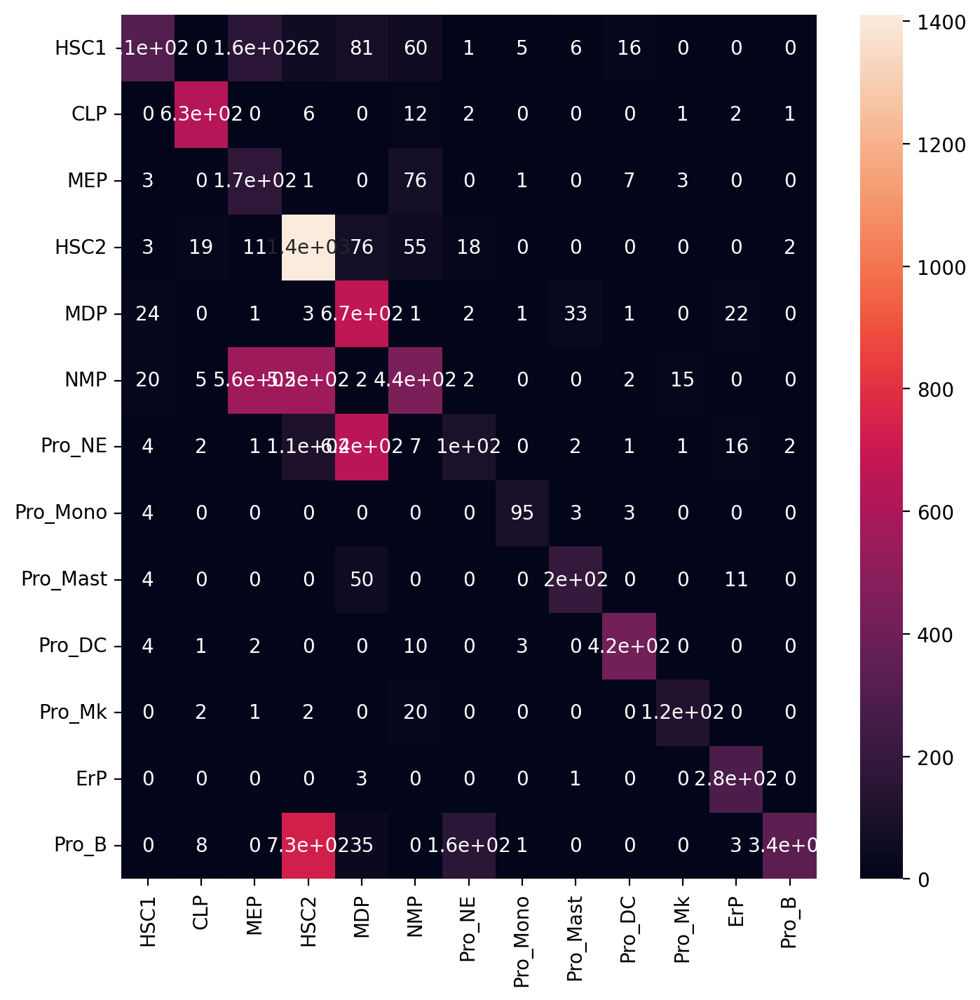

In [74]:
import seaborn as sns
plt.rcParams["figure.figsize"] = [8,8]
sns.heatmap(df2,annot=True)

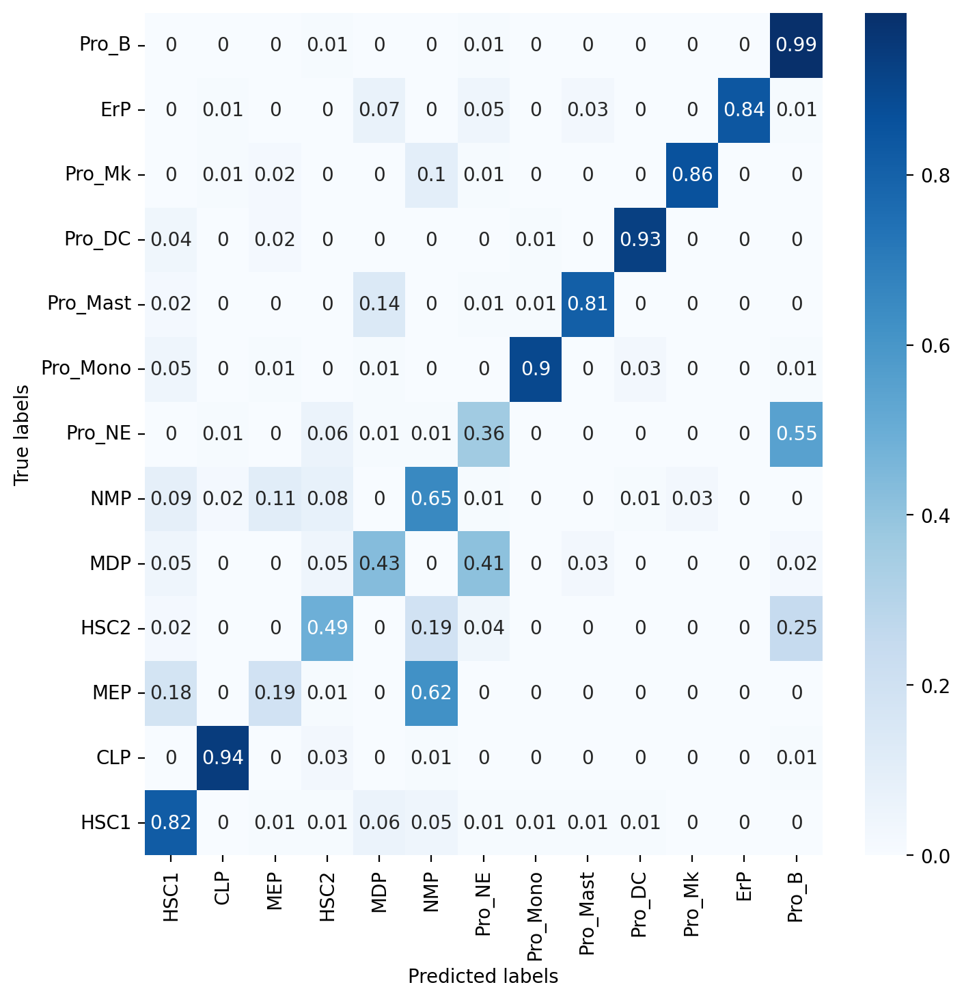

In [80]:
con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["HSC1", "CLP", "MEP", "HSC2", "MDP", "NMP", "Pro_NE", "Pro_Mono", "Pro_Mast","Pro_DC", "Pro_Mk", "ErP", "Pro_B"],
                   columns=["HSC1", "CLP", "MEP", "HSC2", "MDP", "NMP", "Pro_NE", "Pro_Mono", "Pro_Mast","Pro_DC", "Pro_Mk", "ErP", "Pro_B"])
# === plot ===
plt.figure(figsize=(8, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

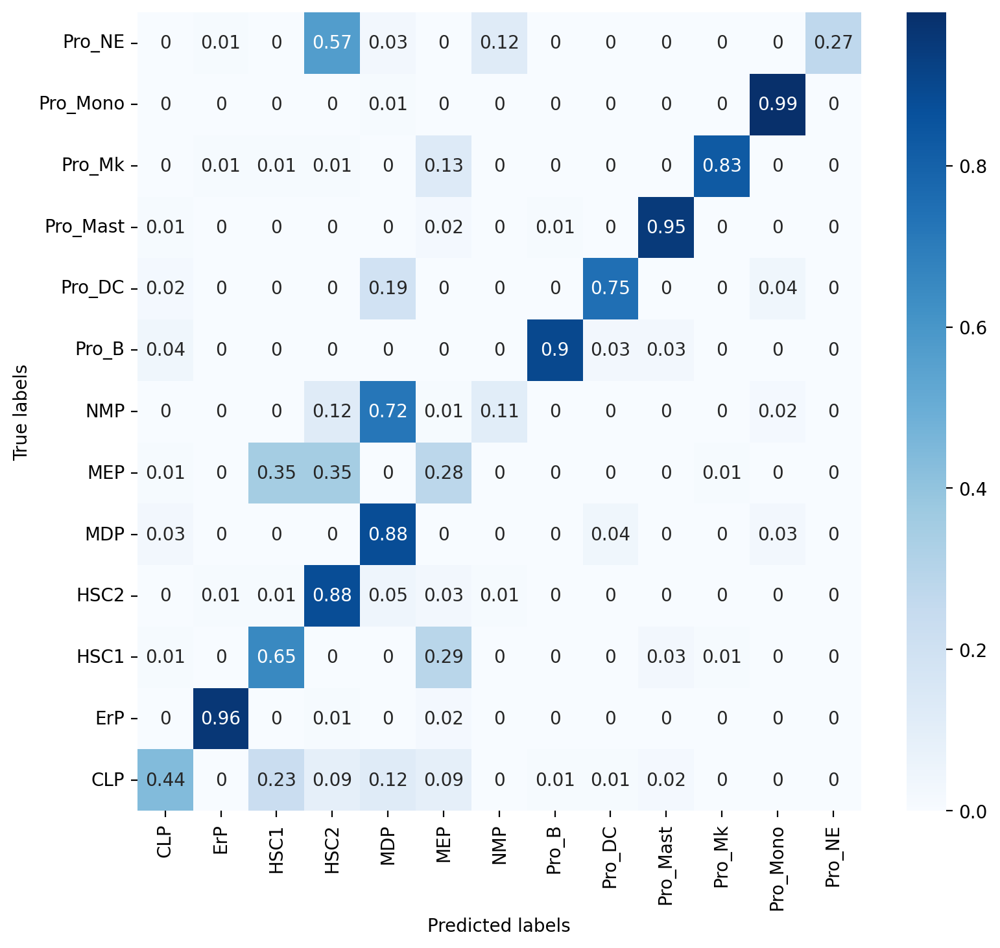

In [89]:
con_mat = confusion_matrix(df['Prediction'],df['cell_type'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

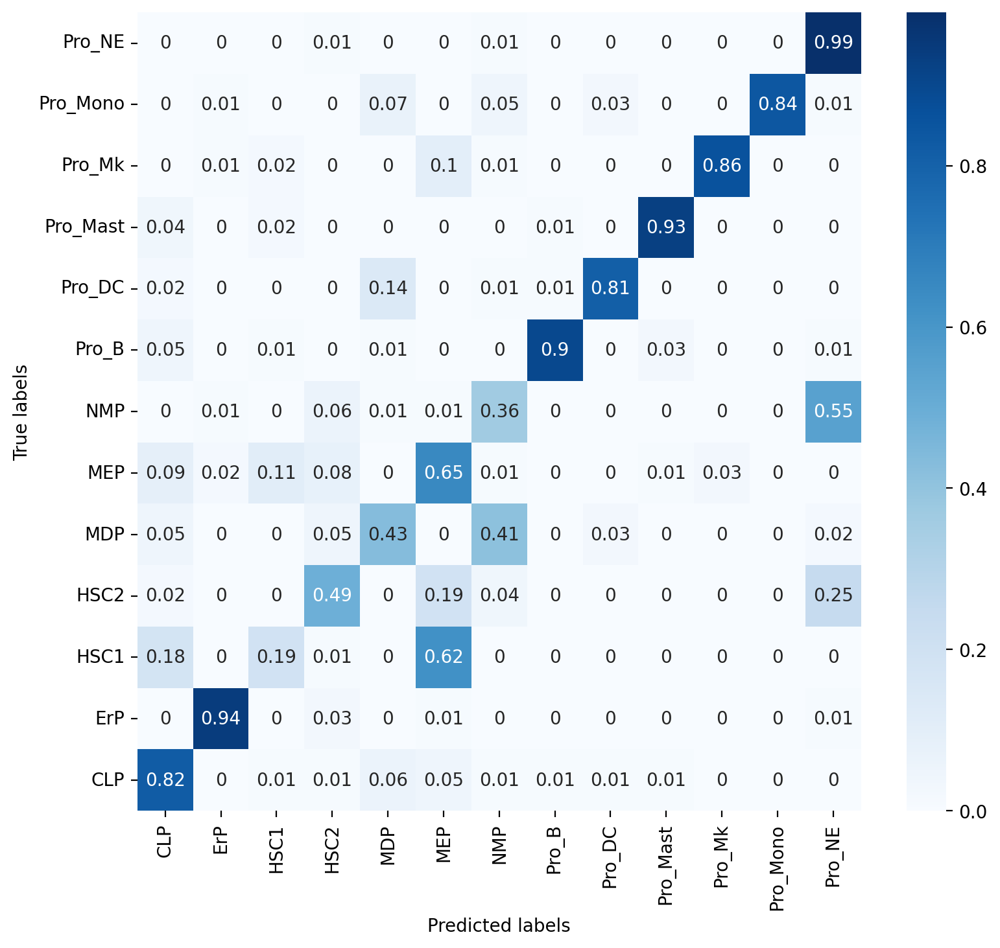

In [93]:
# plotting confusion matrix
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

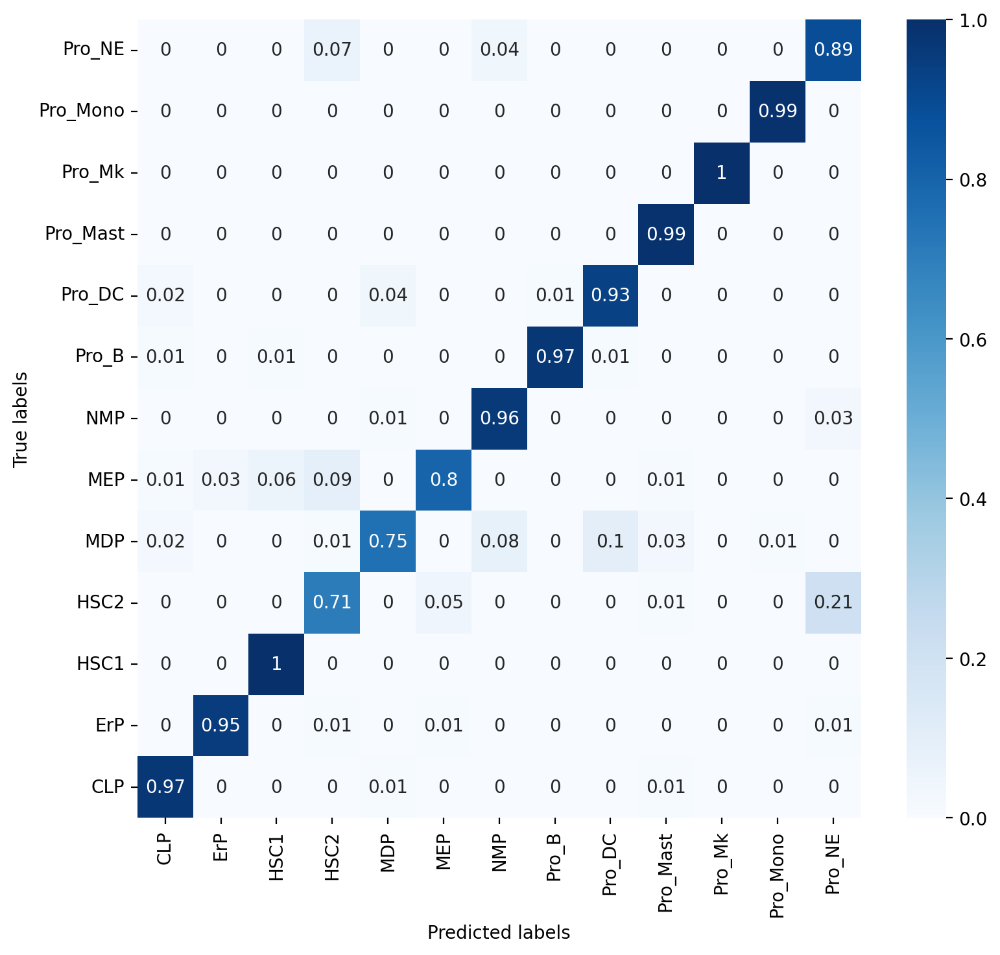

In [101]:
# plotting confusion matrix ### WT
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

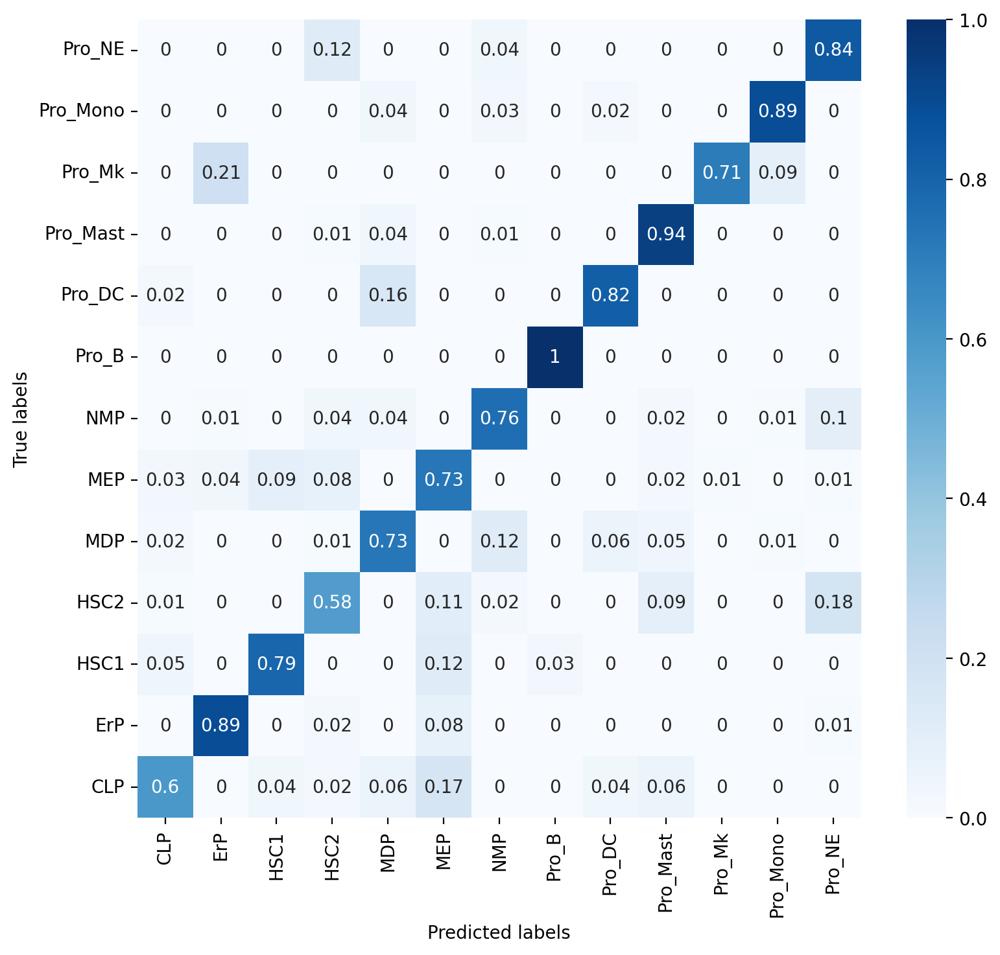

In [105]:
# plotting confusion matrix ### TET2
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

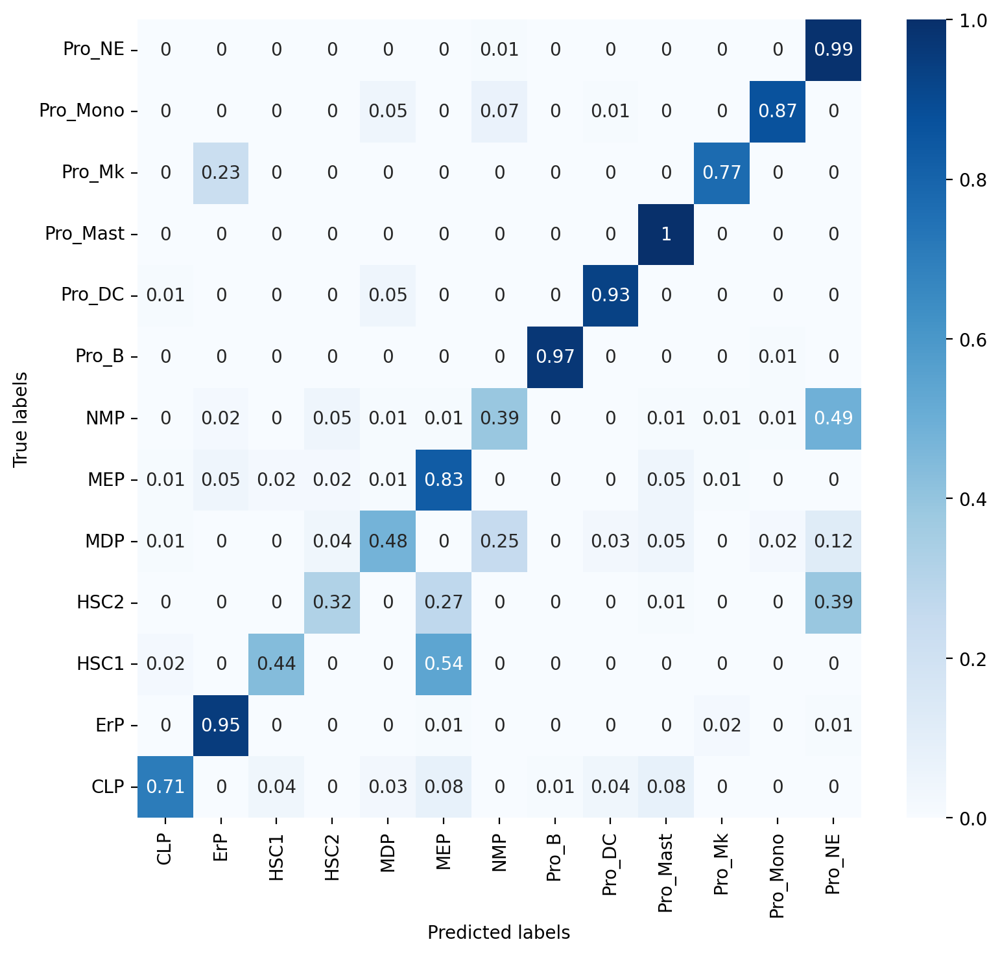

In [110]:
# plotting confusion matrix ### WTDSS
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

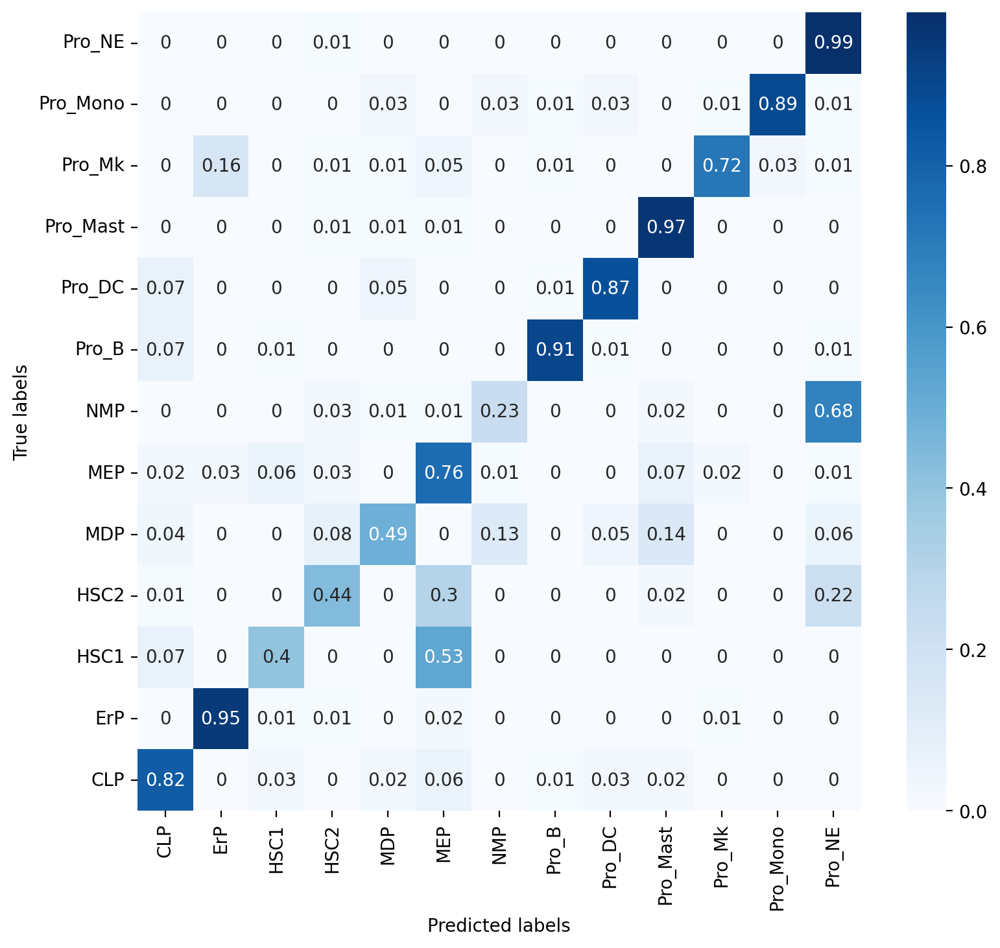

In [115]:
# plotting confusion matrix ### TET2DSS
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'], df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [116]:
new_adata.obs

,Prediction,Probability,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,barcode,UMAP_1,UMAP_2,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
barcode,,,,,,,,,,,,,,,,,,,,
Tet_DSS:GATTACCGTACATCGGAACCTCCT,MEP,0.568820,Tet2mut_DSS,401,338,5.2,14.6,2411,1009,1,1,MEP,Tet_DSS:GATTACCGTACATCGGAACCTCCT,-1.964504,-0.730066,19,268,268.0,4543.279297,0.452263
Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,MEP,0.794320,Tet2mut_DSS,426,367,6.6,8.2,2419,1012,6,6,HSC2,Tet_DSS:TGAGCTAGTTACCGAGACAGCAAC,7.562642,-2.677754,34,284,284.0,4524.904785,0.303345
Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,Pro_Mast,0.674601,Tet2mut_DSS,378,322,19.361277,4.99002,2349,1046,11,11,Pro_Mast,Tet_DSS:ACGGAACATCCGTATGCGTAGGTT,-8.933232,-5.704169,39,210,210.0,5389.157227,0.541414
Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,ErP,0.580436,Tet2mut_DSS,401,357,8.582834,11.377246,2390,1031,9,9,ErP,Tet_DSS:GATCGAGTCGCTAGTAGTTCATGG,-10.320624,1.411969,16,260,260.0,4659.481445,0.319147
Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,Pro_Mk,0.624403,Tet2mut_DSS,402,345,4.581673,15.338645,2414,1007,1,1,MEP,Tet_DSS:CAATGTGGTCCGTATGGCAATTCG,-5.74421,1.783928,24,256,256.0,4768.226562,0.570865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,Pro_NE,0.773097,Tet2mut_DSS,18823,4845,8.335075,12.941521,3851,2190,15,15,Pro_NE,Tet_DSS:CACTAGCTCAACCTAGCTAACTCG,0.961053,-7.978471,535,9745,9745.0,5833.123047,0.065852
Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,ErP,0.910169,Tet2mut_DSS,17135,4842,11.144075,17.240515,4052,2377,16,16,ErP,Tet_DSS:GAAGTTGGGACTTAGGTGGTCCTT,-10.164848,0.411086,583,8026,8026.0,6452.316895,0.548951
Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,Pro_NE,0.831991,Tet2mut_DSS,18419,4813,9.030617,14.123634,3861,2159,15,15,Pro_NE,Tet_DSS:ATGCACGAAGGCTTCTGCCAGTAT,1.216921,-9.705604,364,9108,9108.0,6120.867676,0.080628


In [117]:
con_mat_norm

,CLP,ErP,HSC1,HSC2,MDP,MEP,NMP,Pro_B,Pro_DC,Pro_Mast,Pro_Mk,Pro_Mono,Pro_NE
CLP,0.82,0.00,0.03,0.00,0.02,0.06,0.00,0.01,0.03,0.02,0.00,0.00,0.00
ErP,0.00,0.95,0.01,0.01,0.00,0.02,0.00,0.00,0.00,0.00,0.01,0.00,0.00
HSC1,0.07,0.00,0.40,0.00,0.00,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00
HSC2,0.01,0.00,0.00,0.44,0.00,0.30,0.00,0.00,0.00,0.02,0.00,0.00,0.22
MDP,0.04,0.00,0.00,0.08,0.49,0.00,0.13,0.00,0.05,0.14,0.00,0.00,0.06
MEP,0.02,0.03,0.06,0.03,0.00,0.76,0.01,0.00,0.00,0.07,0.02,0.00,0.01
NMP,0.00,0.00,0.00,0.03,0.01,0.01,0.23,0.00,0.00,0.02,0.00,0.00,0.68
Pro_B,0.07,0.00,0.01,0.00,0.00,0.00,0.00,0.91,0.01,0.00,0.00,0.00,0.01
Pro_DC,0.07,0.00,0.00,0.00,0.05,0.00,0.00,0.01,0.87,0.00,0.00,0.00,0.00
Pro_Mast,0.00,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.97,0.00,0.00,0.00


In [124]:
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 

In [125]:

con_mat_norm.loc[:,order]

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
CLP,0.03,0.82,0.06,0.00,0.02,0.00,0.00,0.00,0.02,0.03,0.00,0.00,0.01
ErP,0.01,0.00,0.02,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.95,0.00
HSC1,0.40,0.07,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
HSC2,0.00,0.01,0.30,0.44,0.00,0.00,0.22,0.00,0.02,0.00,0.00,0.00,0.00
MDP,0.00,0.04,0.00,0.08,0.49,0.13,0.06,0.00,0.14,0.05,0.00,0.00,0.00
MEP,0.06,0.02,0.76,0.03,0.00,0.01,0.01,0.00,0.07,0.00,0.02,0.03,0.00
NMP,0.00,0.00,0.01,0.03,0.01,0.23,0.68,0.00,0.02,0.00,0.00,0.00,0.00
Pro_B,0.01,0.07,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.91
Pro_DC,0.00,0.07,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.87,0.00,0.00,0.01
Pro_Mast,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.97,0.00,0.00,0.00,0.00


In [128]:
con_mat_norm =con_mat_norm.loc[order,:]

In [129]:
con_mat_norm = con_mat_norm.loc[:,order]

In [130]:
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,0.40,0.07,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
CLP,0.03,0.82,0.06,0.00,0.02,0.00,0.00,0.00,0.02,0.03,0.00,0.00,0.01
MEP,0.06,0.02,0.76,0.03,0.00,0.01,0.01,0.00,0.07,0.00,0.02,0.03,0.00
HSC2,0.00,0.01,0.30,0.44,0.00,0.00,0.22,0.00,0.02,0.00,0.00,0.00,0.00
MDP,0.00,0.04,0.00,0.08,0.49,0.13,0.06,0.00,0.14,0.05,0.00,0.00,0.00
NMP,0.00,0.00,0.01,0.03,0.01,0.23,0.68,0.00,0.02,0.00,0.00,0.00,0.00
Pro_NE,0.00,0.00,0.00,0.01,0.00,0.00,0.99,0.00,0.00,0.00,0.00,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.03,0.03,0.01,0.89,0.00,0.03,0.01,0.00,0.01
Pro_Mast,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.97,0.00,0.00,0.00,0.00
Pro_DC,0.00,0.07,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.87,0.00,0.00,0.01


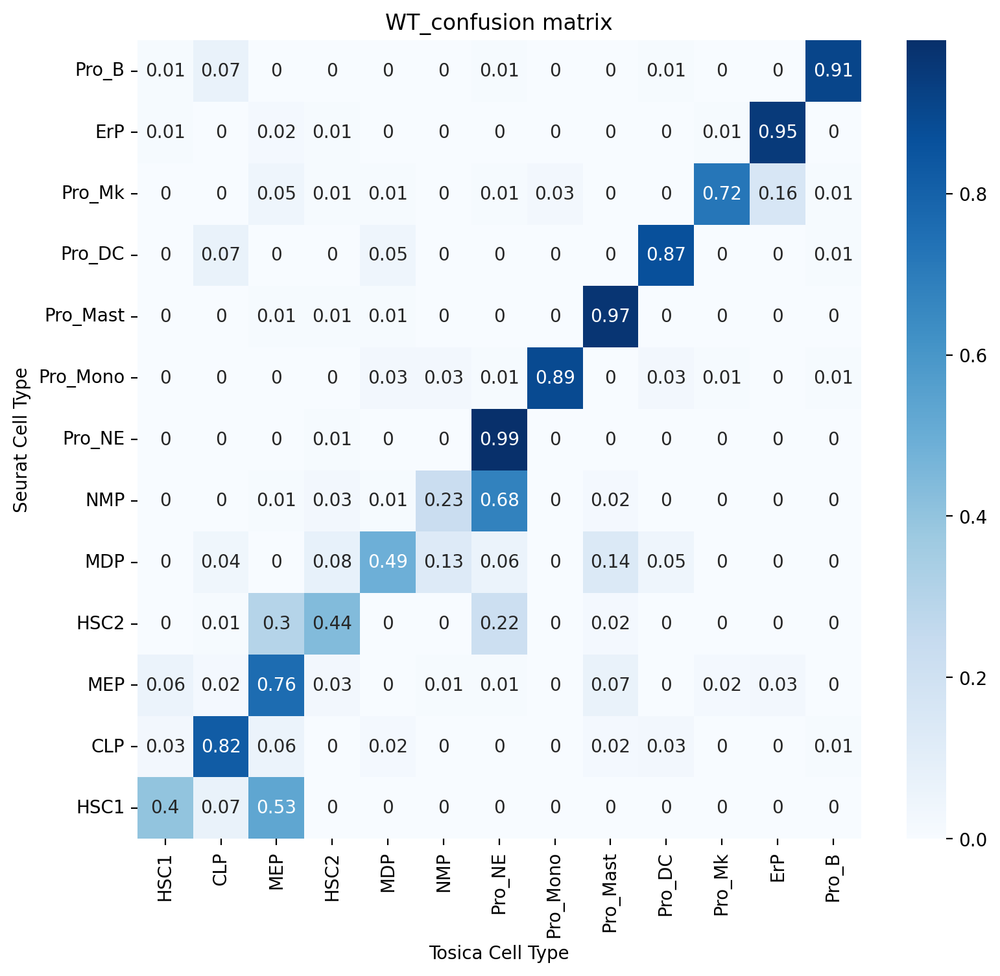

In [133]:
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("WT_confusion matrix")
plt.show()

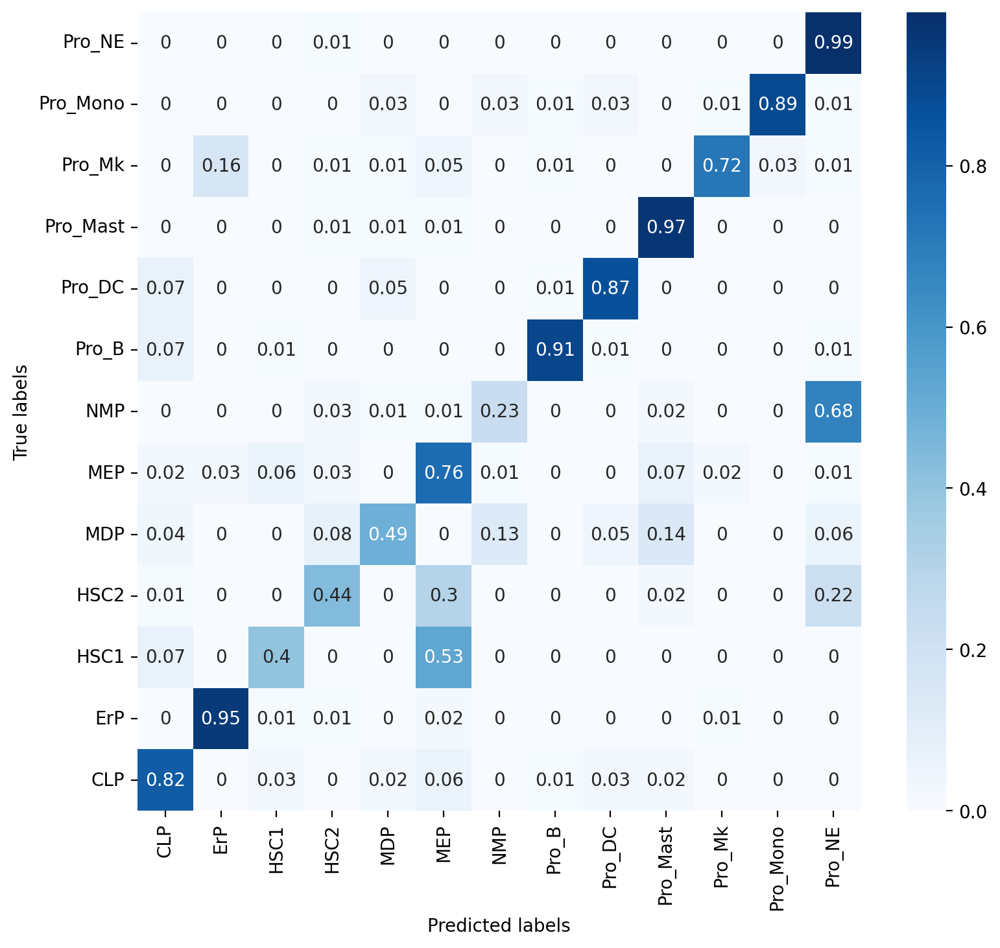

In [138]:
# plotting confusion matrix ### TET2DSS
df = new_adata.obs

con_mat = confusion_matrix(df['cell_type'],df['Prediction'])

con_mat_norm = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]     # 归一化
con_mat_norm = np.around(con_mat_norm, decimals=2)
con_mat_norm = pd.DataFrame(con_mat_norm,
                   index=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ],
                   columns=["CLP", "ErP", "HSC1", "HSC2", "MDP", "MEP", "NMP","Pro_B", "Pro_DC", "Pro_Mast","Pro_Mk",  "Pro_Mono","Pro_NE" ])
# === plot ===
# === plot ===
plt.figure(figsize=(9, 8))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')

plt.ylim(0, 13)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [139]:
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 

In [140]:
order = ["HSC1", 
                                                  "CLP",
                                                  "MEP",
                                                  "HSC2", 
                                                  "MDP", 
                                                  "NMP",
                                                  "Pro_NE",
                                                  "Pro_Mono",
                                                  "Pro_Mast",
                                                  "Pro_DC",
                                                  "Pro_Mk",
                                                  "ErP",
                                                  "Pro_B"] 
con_mat_norm =con_mat_norm.loc[order,:]
con_mat_norm = con_mat_norm.loc[:,order]
con_mat_norm

,HSC1,CLP,MEP,HSC2,MDP,NMP,Pro_NE,Pro_Mono,Pro_Mast,Pro_DC,Pro_Mk,ErP,Pro_B
HSC1,0.40,0.07,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
CLP,0.03,0.82,0.06,0.00,0.02,0.00,0.00,0.00,0.02,0.03,0.00,0.00,0.01
MEP,0.06,0.02,0.76,0.03,0.00,0.01,0.01,0.00,0.07,0.00,0.02,0.03,0.00
HSC2,0.00,0.01,0.30,0.44,0.00,0.00,0.22,0.00,0.02,0.00,0.00,0.00,0.00
MDP,0.00,0.04,0.00,0.08,0.49,0.13,0.06,0.00,0.14,0.05,0.00,0.00,0.00
NMP,0.00,0.00,0.01,0.03,0.01,0.23,0.68,0.00,0.02,0.00,0.00,0.00,0.00
Pro_NE,0.00,0.00,0.00,0.01,0.00,0.00,0.99,0.00,0.00,0.00,0.00,0.00,0.00
Pro_Mono,0.00,0.00,0.00,0.00,0.03,0.03,0.01,0.89,0.00,0.03,0.01,0.00,0.01
Pro_Mast,0.00,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.97,0.00,0.00,0.00,0.00
Pro_DC,0.00,0.07,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.87,0.00,0.00,0.01


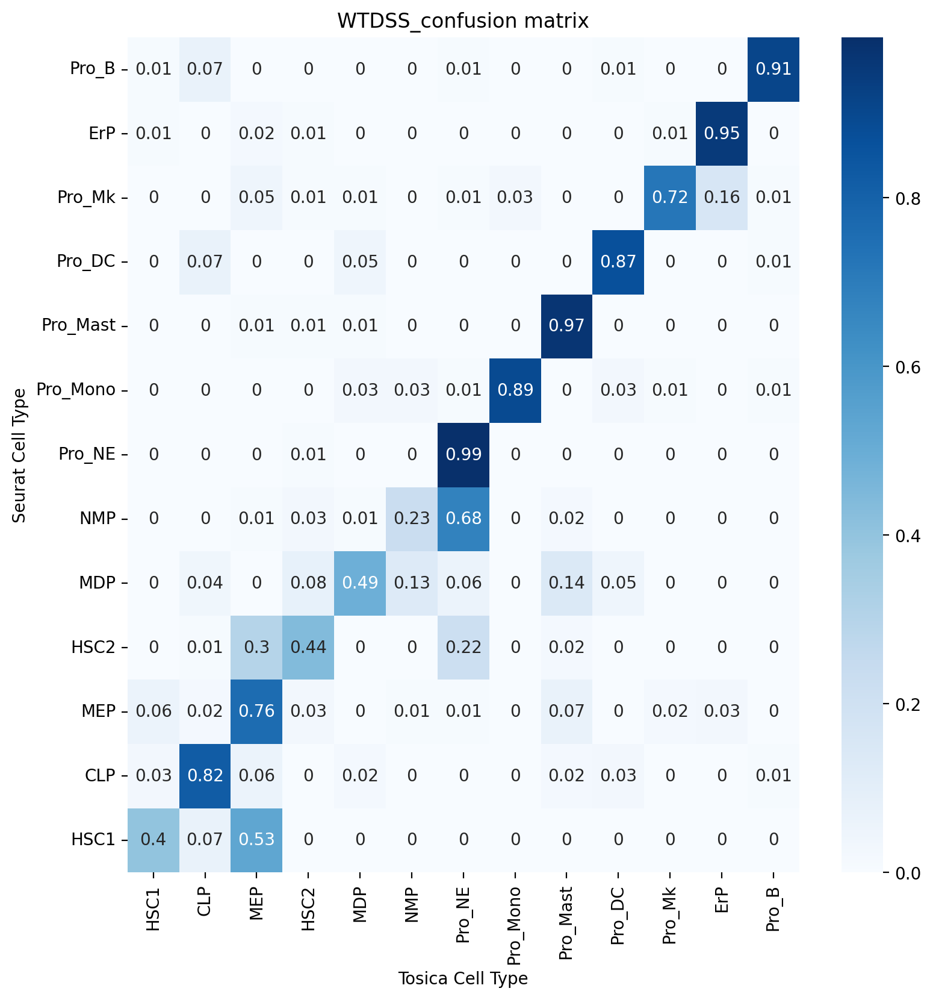

In [144]:
#right one
plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_norm, annot=True, cmap='Blues')
plt.ylim(0, 13)
plt.xlabel('Tosica Cell Type')
plt.ylabel('Seurat Cell Type')
plt.title("WTDSS_confusion matrix")
plt.savefig("WTDSS_confusion matrix.pdf")
plt.show()